In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
%cd gdrive/MyDrive/Datasets/covid

/content/gdrive/MyDrive/Datasets/covid


# Import Data

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score


In [4]:
import warnings
warnings.filterwarnings("ignore")

In [5]:
import pandas as pd

#femal = 2
#male = 1
#Pneumonia = 2
#Covid-19 = 1
#Normal = 0

df = pd.read_csv('ConcatImageBio1.csv')

df.head()

,ImageFinding,patientID,offset,sex,age,RT_PCR_positive,survival,intubated,intubation_present,went_icu,...,pO2_saturation,leukocyte_count,neutrophil_count,lymphocyte_count,hypertension,diabetes,heart_disease,cancer,fatigue,finding
0,1,2,0,1,65,1,1,0,0,0,...,88.086957,3.781508,2.8,0.799734,1,1,1,1,1,1
1,1,2,3,1,65,1,1,0,0,0,...,88.086957,3.781508,2.8,0.799734,1,1,1,1,1,1
2,1,2,5,1,65,1,1,0,0,0,...,88.086957,3.781508,2.8,0.799734,1,1,1,1,1,1
3,1,2,6,1,65,1,1,0,0,0,...,88.086957,3.781508,2.8,0.799734,1,1,1,1,1,1
4,1,4,0,2,52,1,1,0,0,0,...,88.086957,3.781508,2.8,0.799734,0,0,0,0,0,1


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 619 entries, 0 to 618
Data columns (total 24 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   ImageFinding            619 non-null    int64  
 1   patientID               619 non-null    int64  
 2   offset                  619 non-null    int64  
 3   sex                     619 non-null    int64  
 4   age                     619 non-null    int64  
 5   RT_PCR_positive         619 non-null    int64  
 6   survival                619 non-null    int64  
 7   intubated               619 non-null    int64  
 8   intubation_present      619 non-null    int64  
 9   went_icu                619 non-null    int64  
 10  in_icu                  619 non-null    int64  
 11  needed_supplemental_O2  619 non-null    int64  
 12  extubated               619 non-null    int64  
 13  temperature             619 non-null    float64
 14  pO2_saturation          619 non-null    fl

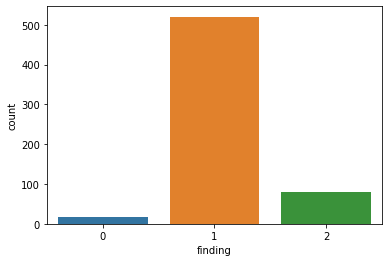

In [7]:
sns.countplot(df['finding'])

In [8]:
feature_cols = ['offset','sex','age','RT_PCR_positive','survival','intubated','intubation_present','went_icu','in_icu','needed_supplemental_O2','extubated','temperature','pO2_saturation','leukocyte_count','neutrophil_count','lymphocyte_count','hypertension','diabetes','heart_disease','cancer','fatigue']

In [9]:



corr_matrix = df[feature_cols].corr()
corr_matrix.style.background_gradient(cmap='coolwarm')



,offset,sex,age,RT_PCR_positive,survival,intubated,intubation_present,went_icu,in_icu,needed_supplemental_O2,extubated,temperature,pO2_saturation,leukocyte_count,neutrophil_count,lymphocyte_count,hypertension,diabetes,heart_disease,cancer,fatigue
offset,1.000000,0.031963,-0.038130,-0.075659,0.047204,0.002934,0.117191,-0.011073,0.029526,0.207548,nan,nan,nan,nan,nan,nan,-0.046794,-0.030258,-0.022907,-0.002427,-0.011679
sex,0.031963,1.000000,0.058310,-0.080941,0.083295,-0.045607,0.072814,-0.065394,-0.044802,0.028781,nan,nan,nan,nan,nan,nan,-0.006753,-0.018232,-0.012318,0.025214,0.043925
age,-0.038130,0.058310,1.000000,-0.154764,-0.279773,0.181914,0.041185,0.095427,0.099239,-0.031176,nan,nan,nan,nan,nan,nan,0.211392,0.116949,0.133895,0.080483,0.012685
RT_PCR_positive,-0.075659,-0.080941,-0.154764,1.000000,0.124292,-0.080813,-0.090326,-0.002370,0.038540,-0.273164,nan,nan,nan,nan,nan,nan,-0.108067,-0.073826,-0.088532,-0.083920,-0.002020
survival,0.047204,0.083295,-0.279773,0.124292,1.000000,-0.358449,-0.092168,-0.318106,-0.292413,0.058793,nan,nan,nan,nan,nan,nan,-0.171820,-0.134534,-0.019202,0.056450,-0.051041
intubated,0.002934,-0.045607,0.181914,-0.080813,-0.358449,1.000000,0.592407,0.569278,0.591966,0.070332,nan,nan,nan,nan,nan,nan,-0.011880,-0.007187,-0.111971,-0.078899,-0.009246
intubation_present,0.117191,0.072814,0.041185,-0.090326,-0.092168,0.592407,1.000000,0.355229,0.509753,0.254014,nan,nan,nan,nan,nan,nan,-0.012073,-0.019364,-0.068957,-0.065365,0.022160
went_icu,-0.011073,-0.065394,0.095427,-0.002370,-0.318106,0.569278,0.355229,1.000000,0.601627,-0.054045,nan,nan,nan,nan,nan,nan,-0.039805,-0.056940,-0.051544,-0.092500,-0.096027
in_icu,0.029526,-0.044802,0.099239,0.038540,-0.292413,0.591966,0.509753,0.601627,1.000000,-0.016377,nan,nan,nan,nan,nan,nan,-0.039540,-0.093065,-0.080014,-0.043445,-0.022110
needed_supplemental_O2,0.207548,0.028781,-0.031176,-0.273164,0.058793,0.070332,0.254014,-0.054045,-0.016377,1.000000,nan,nan,nan,nan,nan,nan,-0.017529,0.035631,0.051544,0.034312,0.190079


In [10]:
from sklearn.model_selection import train_test_split



y = df['finding']
X = df.drop(columns =['ImageFinding','patientID','finding'],axis=1)



In [11]:
np.unique(y,return_counts=True)

(array([0, 1, 2]), array([ 18, 520,  81]))

In [12]:

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3,train_size=0.7,random_state=42)


In [13]:
np.unique(y_test,return_counts=True)

(array([0, 1, 2]), array([  5, 157,  24]))

In [14]:
print("X_train : ",X_train.shape)
print("y_train : ",y_train.shape)
print("X_test : ",X_test.shape)
print("y_test : ",y_test.shape)


X_train :  (433, 21)
y_train :  (433,)
X_test :  (186, 21)
y_test :  (186,)


In [15]:
classes = ['Normal','Covid','Pneumonia']

In [16]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
import pickle
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn import decomposition
from sklearn.decomposition import PCA


In [17]:
def conf_matrix(y_test,y_pred):
  confusion = confusion_matrix(y_test, y_pred, labels=[0, 1,2])
  cm = pd.DataFrame(data=confusion,
                    index=["Normal", "Covid","Pneumonia"],
                    columns=["Predicted Normal", "Predicted Covid", "Predicted Pneumonia"])
  import seaborn as sns
  sns.heatmap(cm,annot=True,fmt="d",cmap=plt.cm.Blues)
  return confusion

In [18]:
import math 
from sklearn.metrics import matthews_corrcoef
from sklearn.metrics import roc_auc_score

def evaluate_model(confusion, y_test,y_pred):

  FP = confusion.sum(axis=0) - np.diag(confusion) 
  FN = confusion.sum(axis=1) - np.diag(confusion) 
  TP = np.diag(confusion) 
  TN = confusion.sum() - (FP + FN + TP)
  FP = FP.astype(float) 
  FN = FN.astype(float) 
  TP = TP.astype(float) 
  TN = TN.astype(float)
  specificity = TN / (TN + FP)

  false_positive_rate = FP / (TN + FP)


  MCC =matthews_corrcoef(y_test, y_pred)

  Recall = TP / (FN + TP)

  NPV  = TN / (TN+FN)
 
 
  accuracy = round(accuracy_score(y_true, y_pred),2)




  specificity = round(sum(specificity)/len(specificity),2)



  sensitivity= round(metrics.recall_score(y_test, y_pred, average="macro"),2)
  
  precision = round(metrics.precision_score(y_test, y_pred, average="macro" ),2)


  recall = round(sum(Recall)/3,2)
  

  fscore = round(metrics.f1_score(y_test, y_pred,average="macro"),2)
 

  MCC = round(MCC,2)
  

  NPV = round(sum(NPV)/3,2)
 
  return accuracy,specificity,sensitivity,precision,recall,fscore,MCC,NPV

In [19]:
Methods = ['DT','LR','MLP','NB','RF','SVM']
Metrics = ['Accuracy','Specifity','Sensitivity','Precision','Recall','F1-Score','Mcc','NPV']

In [20]:


compare_df = pd.DataFrame(index = Methods, columns = Metrics)

# MLP


In [ ]:
from sklearn.neural_network import MLPClassifier
mlp = MLPClassifier()

In [ ]:

# # load the model from disk
# loaded_model = pickle.load(open(filename, 'rb'))

In [ ]:

param_grid = {
    'hidden_layer_sizes':[(50,50),(500,500)],
    'activation':[ 'logistic', 'relu', 'softmax', 'tanh'],
    'solver': ['adam', 'lbfgs'],
    'alpha': [0.001,0.01],
  
    
    'max_iter': [200],
    'shuffle': [True,False] 
}

gridSearch = GridSearchCV(MLPClassifier(), param_grid, cv=3,
                          verbose=2)
gridSearch.fit(X_train, y_train)


In [ ]:
print('Score: ', gridSearch.best_score_)
print('Parameters: ', gridSearch.best_params_)

Score:  0.9030491698595147
Parameters:  {'activation': 'tanh', 'alpha': 0.01, 'hidden_layer_sizes': (50, 50), 'max_iter': 200, 'shuffle': False, 'solver': 'adam'}


In [ ]:
MLP = MLPClassifier(activation= 'tanh',
                    alpha= 0.01,
                    hidden_layer_sizes= (50, 50),
                    shuffle= False, 
                    solver='adam',
                    max_iter= 200)
MLP.fit(X_train,y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


MLPClassifier(activation='tanh', alpha=0.01, hidden_layer_sizes=(50, 50),
              shuffle=False)

In [ ]:
import pickle
filename = 'mlp-model.pkl'
pickle.dump(MLP, open(filename, 'wb'))

## Evaluation

In [ ]:
# # load the model from disk
MLP = pickle.load(open('mlp-model.pkl', 'rb'))

In [ ]:
y_true, y_pred = y_test , MLP.predict(X_test)

print('Results on the test set:')
print(classification_report(y_true, y_pred))

Results on the test set:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         5
           1       0.91      1.00      0.95       157
           2       1.00      0.58      0.74        24

    accuracy                           0.92       186
   macro avg       0.64      0.53      0.56       186
weighted avg       0.90      0.92      0.90       186



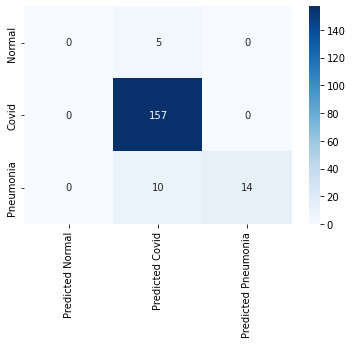

In [ ]:
confusion = conf_matrix(y_test,y_pred)

In [ ]:
compare_df.loc['MLP'] = evaluate_model(confusion, y_test,y_pred)

# Decision Tree

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
from sklearn import decomposition, datasets
from sklearn import tree
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler

In [ ]:
dec_tree = tree.DecisionTreeClassifier()



In [ ]:
param_grid = {
    'criterion': ['gini','entropy','log_loss'],
    'splitter': ['best','random'],
    'max_features' : ['auto','log2','sqrt'],
    'max_depth': [50,100,150,200,1000]

}

grid = GridSearchCV(dec_tree, param_grid, cv=3,
                          verbose=2)
grid.fit(X_train, y_train)

In [ ]:
print('Score: ', grid.best_score_)
print('Parameters: ', grid.best_params_)

Score:  0.8752554278416348
Parameters:  {'criterion': 'entropy', 'max_depth': 100, 'max_features': 'auto', 'splitter': 'best'}


In [ ]:
params =  grid.best_params_

DT = tree.DecisionTreeClassifier(criterion = "entropy",
            max_depth = 100, max_features = 'log2', splitter = 'random')


## Then train it and display the results
history = DT.fit(X_train,
                    y_train)



## Evaluation

In [ ]:
import pickle
filename = 'dt-model.pkl'
# pickle.dump(DT, open(filename, 'wb'))
with open(filename, 'rb') as f:
    DT =   pickle.load(f)

In [ ]:
y_true, y_pred = y_test , DT.predict(X_test)

from sklearn.metrics import classification_report
print('Results on the test set:')
print(classification_report(y_true, y_pred,target_names=classes))

Results on the test set:
              precision    recall  f1-score   support

      Normal       0.20      0.20      0.20         5
       Covid       0.94      0.94      0.94       157
   Pneumonia       0.75      0.75      0.75        24

    accuracy                           0.90       186
   macro avg       0.63      0.63      0.63       186
weighted avg       0.90      0.90      0.90       186



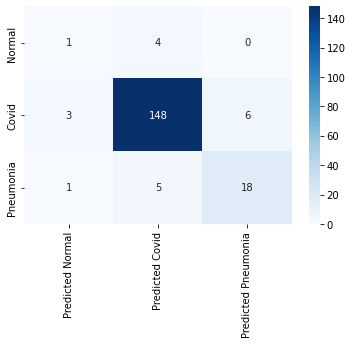

In [ ]:
confusion = confusion_matrix(y_test, y_pred, labels=[0, 1,2])
cm = pd.DataFrame(data=confusion,
                  index=["Normal", "Covid","Pneumonia"],
                  columns=["Predicted Normal", "Predicted Covid", "Predicted Pneumonia"])
import seaborn as sns
sns.heatmap(cm,annot=True,fmt="d",cmap=plt.cm.Blues)

In [ ]:
compare_df.loc['DT'] = evaluate_model(confusion, y_test,y_pred)

In [ ]:
from sklearn.tree import export_graphviz

dot_data = export_graphviz(DT, out_file=None, 
            filled=True, rounded=True,feature_names = feature_cols,  class_names=['Normal','Covid','Pneumonia'])

In [ ]:
import graphviz

graph = graphviz.Source(dot_data) 
graph.format = 'png'
graph.render('decision_tree',view=True) 


'decision_tree.png'

# Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
random_forest = RandomForestClassifier()


In [ ]:
random_forest.get_params().keys()

dict_keys(['bootstrap', 'ccp_alpha', 'class_weight', 'criterion', 'max_depth', 'max_features', 'max_leaf_nodes', 'max_samples', 'min_impurity_decrease', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'n_estimators', 'n_jobs', 'oob_score', 'random_state', 'verbose', 'warm_start'])

In [ ]:
param_grid = {
    'criterion': ['gini','entropy'],
    'n_estimators': [5,10,20,30,50,100,200],
    
    'max_depth': [2,5,8,10,15],
    "max_features": ['auto', 'sqrt', 'log2'],
   
    

}

grid = GridSearchCV(random_forest, param_grid, cv=3,
                          verbose=2)
grid.fit(X_train, y_train)

In [ ]:
print('Score: ', grid.best_score_)
print('Parameters: ', grid.best_params_)

Score:  0.9214719029374202
Parameters:  {'criterion': 'gini', 'max_depth': 8, 'max_features': 'log2', 'n_estimators': 10}


In [ ]:
RF = RandomForestClassifier(criterion= 'gini',
                            max_depth= 8, max_features= 'log2', n_estimators= 10)


history = RF.fit(X_train,
                    y_train)

In [ ]:
import pickle
filename = 'rf-model.pkl'
pickle.dump(RF, open(filename, 'wb'))

## Evaluation

In [ ]:
import pickle
filename = 'rf-model.pkl'

with open(filename, 'rb') as f:
    RF =   pickle.load(f)

In [ ]:
y_true, y_pred = y_test , RF.predict(X_test)

from sklearn.metrics import classification_report
print('Results on the test set:')
print(classification_report(y_true, y_pred))

Results on the test set:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         5
           1       0.91      0.99      0.95       157
           2       0.93      0.54      0.68        24

    accuracy                           0.91       186
   macro avg       0.61      0.51      0.54       186
weighted avg       0.89      0.91      0.89       186



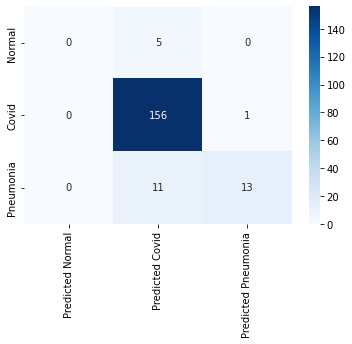

In [ ]:
confusion = confusion_matrix(y_test, y_pred, labels=[0, 1,2])
cm = pd.DataFrame(data=confusion,
                  index=["Normal", "Covid","Pneumonia"],
                  columns=["Predicted Normal", "Predicted Covid", "Predicted Pneumonia"])
import seaborn as sns
sns.heatmap(cm,annot=True,fmt="d",cmap=plt.cm.Blues)

In [ ]:
compare_df.loc['RF'] = evaluate_model(confusion, y_test,y_pred)

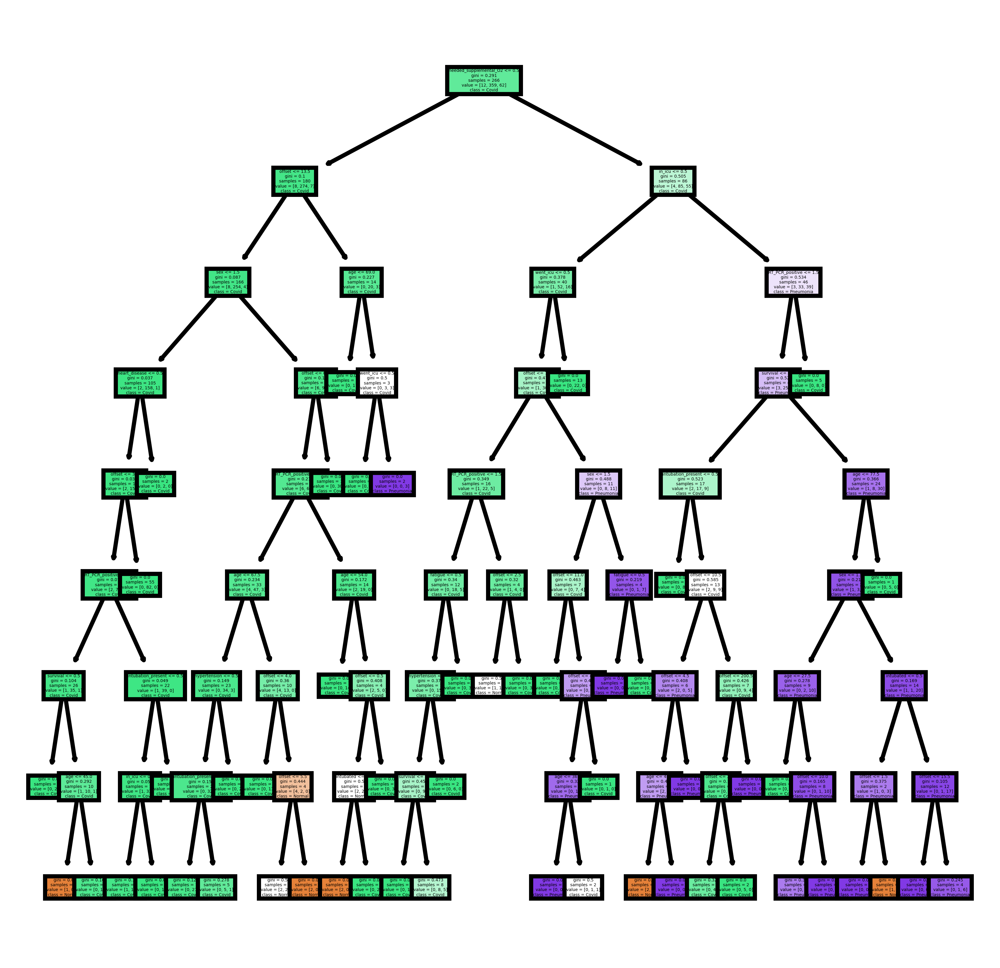

In [ ]:
from sklearn.tree import export_graphviz
from sklearn import tree

fig, axes = plt.subplots(figsize = (4,4), dpi=1000)
tree.plot_tree(RF.estimators_[0],
               feature_names = feature_cols, 
               class_names=classes,
               filled = True);
fig.savefig('rf_individualtree.png')

# SVM

In [ ]:
from sklearn.svm import SVC

In [ ]:
param_grid = {'C': [ 1, 5,10,50],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf','linear'],
              'probability':[True]}
 
grid = GridSearchCV(SVC(), param_grid, refit = True, verbose = 2,cv = 3)
 
# fitting the model for grid search
grid.fit(X_train, y_train)

Fitting 3 folds for each of 40 candidates, totalling 120 fits
[CV] END .........C=1, gamma=1, kernel=rbf, probability=True; total time=   0.1s
[CV] END .........C=1, gamma=1, kernel=rbf, probability=True; total time=   0.1s
[CV] END .........C=1, gamma=1, kernel=rbf, probability=True; total time=   0.1s
[CV] END ......C=1, gamma=1, kernel=linear, probability=True; total time=   0.2s
[CV] END ......C=1, gamma=1, kernel=linear, probability=True; total time=   0.2s
[CV] END ......C=1, gamma=1, kernel=linear, probability=True; total time=   0.2s
[CV] END .......C=1, gamma=0.1, kernel=rbf, probability=True; total time=   0.1s
[CV] END .......C=1, gamma=0.1, kernel=rbf, probability=True; total time=   0.0s
[CV] END .......C=1, gamma=0.1, kernel=rbf, probability=True; total time=   0.0s
[CV] END ....C=1, gamma=0.1, kernel=linear, probability=True; total time=   0.3s
[CV] END ....C=1, gamma=0.1, kernel=linear, probability=True; total time=   0.2s
[CV] END ....C=1, gamma=0.1, kernel=linear, pro

GridSearchCV(cv=3, estimator=SVC(),
             param_grid={'C': [1, 5, 10, 50],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf', 'linear'], 'probability': [True]},
             verbose=2)

In [ ]:
# print best parameter after tuning
print(grid.best_params_)
 
# print how our model looks after hyper-parameter tuning
print(grid.best_estimator_)

{'C': 5, 'gamma': 1, 'kernel': 'linear', 'probability': True}
SVC(C=5, gamma=1, kernel='linear', probability=True)


In [ ]:
SVM = SVC(C =  5, 
          gamma = 0.1,
          kernel=  'linear',
          probability =  True)
SVM.fit(X_train,y_train)

SVC(C=5, gamma=0.1, kernel='linear', probability=True)

In [ ]:
import pickle
filename = 'svm-model.pkl'
pickle.dump(SVM, open(filename, 'wb'))

## Evaluation

In [ ]:
import pickle
filename = 'svm-model.pkl'
# pickle.dump(DT, open(filename, 'wb'))
with open(filename, 'rb') as f:
    SVM =   pickle.load(f)

In [ ]:

y_true,y_pred =y_test, SVM.predict(X_test)
 
# print classification report
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         5
           1       0.93      0.96      0.94       157
           2       0.70      0.67      0.68        24

    accuracy                           0.89       186
   macro avg       0.54      0.54      0.54       186
weighted avg       0.88      0.89      0.88       186



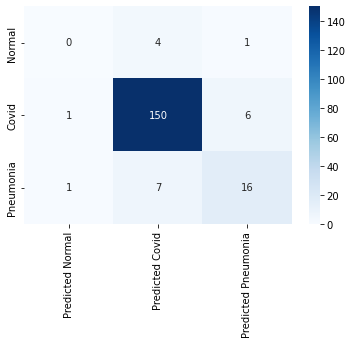

In [ ]:
confusion = confusion_matrix(y_test, y_pred, labels=[0, 1,2])
cm = pd.DataFrame(data=confusion,
                  index=["Normal", "Covid","Pneumonia"],
                  columns=["Predicted Normal", "Predicted Covid", "Predicted Pneumonia"])
import seaborn as sns
sns.heatmap(cm,annot=True,fmt="d",cmap=plt.cm.Blues)

In [ ]:
compare_df.loc['SVM'] = evaluate_model(confusion, y_test,y_pred)

# Logistic Regression

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

param_grid= {"C":[0.001,0.01,0.1,1,10], 
      "penalty":["l1","l2"],
       'tol' : [0.0001],
       'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
       'max_iter': [1000],
       'verbose' :[2],
       'n_jobs':[-1]
       }

grid = GridSearchCV(LogisticRegression(), param_grid, refit = True, verbose = 2,cv = 3)

grid.fit(X_train,y_train)


Fitting 3 folds for each of 50 candidates, totalling 150 fits
[CV] END C=0.001, max_iter=1000, n_jobs=-1, penalty=l1, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.0s
[CV] END C=0.001, max_iter=1000, n_jobs=-1, penalty=l1, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.0s
[CV] END C=0.001, max_iter=1000, n_jobs=-1, penalty=l1, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.0s
[CV] END C=0.001, max_iter=1000, n_jobs=-1, penalty=l1, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.0s
[CV] END C=0.001, max_iter=1000, n_jobs=-1, penalty=l1, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.0s
[CV] END C=0.001, max_iter=1000, n_jobs=-1, penalty=l1, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.0s
[LibLinear][CV] END C=0.001, max_iter=1000, n_jobs=-1, penalty=l1, solver=liblinear, tol=0.0001, verbose=2; total time=   0.0s
[LibLinear][CV] END C=0.001, max_iter=1000, n_jobs=-1, penalty=l1, solver=liblinear, tol=0.0001, verbose=2; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    1.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=0.001, max_iter=1000, n_jobs=-1, penalty=l1, solver=saga, tol=0.0001, verbose=2; total time=   1.5s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=0.001, max_iter=1000, n_jobs=-1, penalty=l1, solver=saga, tol=0.0001, verbose=2; total time=   0.7s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=0.001, max_iter=1000, n_jobs=-1, penalty=l1, solver=saga, tol=0.0001, verbose=2; total time=   0.6s
[CV] END C=0.001, max_iter=1000, n_jobs=-1, penalty=l2, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.1s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=0.001, max_iter=1000, n_jobs=-1, penalty=l2, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.1s
[CV] END C=0.001, max_iter=1000, n_jobs=-1, penalty=l2, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.1s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=0.001, max_iter=1000, n_jobs=-1, penalty=l2, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.1s
[CV] END C=0.001, max_iter=1000, n_jobs=-1, penalty=l2, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.1s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.1s finished
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=0.001, max_iter=1000, n_jobs=-1, penalty=l2, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.1s
[LibLinear][CV] END C=0.001, max_iter=1000, n_jobs=-1, penalty=l2, solver=liblinear, tol=0.0001, verbose=2; total time=   0.0s
[LibLinear][CV] END C=0.001, max_iter=1000, n_jobs=-1, penalty=l2, solver=liblinear, tol=0.0001, verbose=2; total time=   0.0s
[LibLinear][CV] END C=0.001, max_iter=1000, n_jobs=-1, penalty=l2, solver=liblinear, tol=0.0001, verbose=2; total time=   0.0s
[CV] END C=0.001, max_iter=1000, n_jobs=-1, penalty=l2, solver=sag, tol=0.0001, verbose=2; total time=   0.1s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=0.001, max_iter=1000, n_jobs=-1, penalty=l2, solver=sag, tol=0.0001, verbose=2; total time=   0.1s
[CV] END C=0.001, max_iter=1000, n_jobs=-1, penalty=l2, solver=sag, tol=0.0001, verbose=2; total time=   0.0s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=0.001, max_iter=1000, n_jobs=-1, penalty=l2, solver=saga, tol=0.0001, verbose=2; total time=   0.2s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.1s finished
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=0.001, max_iter=1000, n_jobs=-1, penalty=l2, solver=saga, tol=0.0001, verbose=2; total time=   0.3s
[CV] END C=0.001, max_iter=1000, n_jobs=-1, penalty=l2, solver=saga, tol=0.0001, verbose=2; total time=   0.1s
[CV] END C=0.01, max_iter=1000, n_jobs=-1, penalty=l1, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.0s
[CV] END C=0.01, max_iter=1000, n_jobs=-1, penalty=l1, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.0s
[CV] END C=0.01, max_iter=1000, n_jobs=-1, penalty=l1, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.0s
[CV] END C=0.01, max_iter=1000, n_jobs=-1, penalty=l1, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.0s
[CV] END C=0.01, max_iter=1000, n_jobs=-1, penalty=l1, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.0s
[CV] END C=0.01, max_iter=1000, n_jobs=-1, penalty=l1, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.0s
[LibLinear][CV] END C=0.01, max_iter=1000, n_jobs=-1, penalty=l1, solver=liblinear, tol=0.0001, verb

[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=0.01, max_iter=1000, n_jobs=-1, penalty=l1, solver=saga, tol=0.0001, verbose=2; total time=   0.1s
[CV] END C=0.01, max_iter=1000, n_jobs=-1, penalty=l1, solver=saga, tol=0.0001, verbose=2; total time=   0.1s
[CV] END C=0.01, max_iter=1000, n_jobs=-1, penalty=l1, solver=saga, tol=0.0001, verbose=2; total time=   0.0s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=0.01, max_iter=1000, n_jobs=-1, penalty=l2, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.1s
[CV] END C=0.01, max_iter=1000, n_jobs=-1, penalty=l2, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.1s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.1s finished


[CV] END C=0.01, max_iter=1000, n_jobs=-1, penalty=l2, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.1s
[CV] END C=0.01, max_iter=1000, n_jobs=-1, penalty=l2, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.1s
[CV] END C=0.01, max_iter=1000, n_jobs=-1, penalty=l2, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.1s


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.1s finished
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=0.01, max_iter=1000, n_jobs=-1, penalty=l2, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.1s
[LibLinear][CV] END C=0.01, max_iter=1000, n_jobs=-1, penalty=l2, solver=liblinear, tol=0.0001, verbose=2; total time=   0.0s
[LibLinear][CV] END C=0.01, max_iter=1000, n_jobs=-1, penalty=l2, solver=liblinear, tol=0.0001, verbose=2; total time=   0.0s
[LibLinear][CV] END C=0.01, max_iter=1000, n_jobs=-1, penalty=l2, solver=liblinear, tol=0.0001, verbose=2; total time=   0.0s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=0.01, max_iter=1000, n_jobs=-1, penalty=l2, solver=sag, tol=0.0001, verbose=2; total time=   0.4s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=0.01, max_iter=1000, n_jobs=-1, penalty=l2, solver=sag, tol=0.0001, verbose=2; total time=   0.5s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=0.01, max_iter=1000, n_jobs=-1, penalty=l2, solver=sag, tol=0.0001, verbose=2; total time=   0.6s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    1.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=0.01, max_iter=1000, n_jobs=-1, penalty=l2, solver=saga, tol=0.0001, verbose=2; total time=   1.0s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=0.01, max_iter=1000, n_jobs=-1, penalty=l2, solver=saga, tol=0.0001, verbose=2; total time=   0.5s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.4s finished
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))


[CV] END C=0.01, max_iter=1000, n_jobs=-1, penalty=l2, solver=saga, tol=0.0001, verbose=2; total time=   0.4s
[CV] END C=0.1, max_iter=1000, n_jobs=-1, penalty=l1, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.0s
[CV] END C=0.1, max_iter=1000, n_jobs=-1, penalty=l1, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.0s
[CV] END C=0.1, max_iter=1000, n_jobs=-1, penalty=l1, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.0s
[CV] END C=0.1, max_iter=1000, n_jobs=-1, penalty=l1, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.0s
[CV] END C=0.1, max_iter=1000, n_jobs=-1, penalty=l1, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.0s
[CV] END C=0.1, max_iter=1000, n_jobs=-1, penalty=l1, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.0s
[LibLinear][CV] END C=0.1, max_iter=1000, n_jobs=-1, penalty=l1, solver=liblinear, tol=0.0001, verbose=2; total time=   0.1s
[LibLinear][CV] END C=0.1, max_iter=1000, n_jobs=-1, penalty=l1, solver=liblinear, tol=0.0001

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=0.1, max_iter=1000, n_jobs=-1, penalty=l1, solver=saga, tol=0.0001, verbose=2; total time=   0.6s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=0.1, max_iter=1000, n_jobs=-1, penalty=l1, solver=saga, tol=0.0001, verbose=2; total time=   0.6s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=0.1, max_iter=1000, n_jobs=-1, penalty=l1, solver=saga, tol=0.0001, verbose=2; total time=   0.6s
[CV] END C=0.1, max_iter=1000, n_jobs=-1, penalty=l2, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.1s
[CV] END C=0.1, max_iter=1000, n_jobs=-1, penalty=l2, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.1s
[CV] END C=0.1, max_iter=1000, n_jobs=-1, penalty=l2, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.1s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.1s finished
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))


[CV] END C=0.1, max_iter=1000, n_jobs=-1, penalty=l2, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.1s
[CV] END C=0.1, max_iter=1000, n_jobs=-1, penalty=l2, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.1s
[CV] END C=0.1, max_iter=1000, n_jobs=-1, penalty=l2, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.1s
[LibLinear][CV] END C=0.1, max_iter=1000, n_jobs=-1, penalty=l2, solver=liblinear, tol=0.0001, verbose=2; total time=   0.0s
[LibLinear][CV] END C=0.1, max_iter=1000, n_jobs=-1, penalty=l2, solver=liblinear, tol=0.0001, verbose=2; total time=   0.0s
[LibLinear][CV] END C=0.1, max_iter=1000, n_jobs=-1, penalty=l2, solver=liblinear, tol=0.0001, verbose=2; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=0.1, max_iter=1000, n_jobs=-1, penalty=l2, solver=sag, tol=0.0001, verbose=2; total time=   0.3s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=0.1, max_iter=1000, n_jobs=-1, penalty=l2, solver=sag, tol=0.0001, verbose=2; total time=   0.3s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=0.1, max_iter=1000, n_jobs=-1, penalty=l2, solver=sag, tol=0.0001, verbose=2; total time=   0.3s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=0.1, max_iter=1000, n_jobs=-1, penalty=l2, solver=saga, tol=0.0001, verbose=2; total time=   0.3s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=0.1, max_iter=1000, n_jobs=-1, penalty=l2, solver=saga, tol=0.0001, verbose=2; total time=   0.3s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.3s finished
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))


[CV] END C=0.1, max_iter=1000, n_jobs=-1, penalty=l2, solver=saga, tol=0.0001, verbose=2; total time=   0.3s
[CV] END C=1, max_iter=1000, n_jobs=-1, penalty=l1, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.0s
[CV] END C=1, max_iter=1000, n_jobs=-1, penalty=l1, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.0s
[CV] END C=1, max_iter=1000, n_jobs=-1, penalty=l1, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.0s
[CV] END C=1, max_iter=1000, n_jobs=-1, penalty=l1, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.0s
[CV] END C=1, max_iter=1000, n_jobs=-1, penalty=l1, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.0s
[CV] END C=1, max_iter=1000, n_jobs=-1, penalty=l1, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.0s
[LibLinear][CV] END C=1, max_iter=1000, n_jobs=-1, penalty=l1, solver=liblinear, tol=0.0001, verbose=2; total time=   0.1s
[LibLinear][CV] END C=1, max_iter=1000, n_jobs=-1, penalty=l1, solver=liblinear, tol=0.0001, verbose=2; tota

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=1, max_iter=1000, n_jobs=-1, penalty=l1, solver=saga, tol=0.0001, verbose=2; total time=   0.4s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=1, max_iter=1000, n_jobs=-1, penalty=l1, solver=saga, tol=0.0001, verbose=2; total time=   0.4s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=1, max_iter=1000, n_jobs=-1, penalty=l1, solver=saga, tol=0.0001, verbose=2; total time=   0.4s
[CV] END C=1, max_iter=1000, n_jobs=-1, penalty=l2, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.1s
[CV] END C=1, max_iter=1000, n_jobs=-1, penalty=l2, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.1s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=1, max_iter=1000, n_jobs=-1, penalty=l2, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.1s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=1, max_iter=1000, n_jobs=-1, penalty=l2, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.2s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=1, max_iter=1000, n_jobs=-1, penalty=l2, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.3s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.3s finished
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=1, max_iter=1000, n_jobs=-1, penalty=l2, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.3s
[LibLinear][CV] END C=1, max_iter=1000, n_jobs=-1, penalty=l2, solver=liblinear, tol=0.0001, verbose=2; total time=   0.0s
[LibLinear][CV] END C=1, max_iter=1000, n_jobs=-1, penalty=l2, solver=liblinear, tol=0.0001, verbose=2; total time=   0.0s
[LibLinear][CV] END C=1, max_iter=1000, n_jobs=-1, penalty=l2, solver=liblinear, tol=0.0001, verbose=2; total time=   0.0s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=1, max_iter=1000, n_jobs=-1, penalty=l2, solver=sag, tol=0.0001, verbose=2; total time=   0.3s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=1, max_iter=1000, n_jobs=-1, penalty=l2, solver=sag, tol=0.0001, verbose=2; total time=   0.3s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=1, max_iter=1000, n_jobs=-1, penalty=l2, solver=sag, tol=0.0001, verbose=2; total time=   0.3s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=1, max_iter=1000, n_jobs=-1, penalty=l2, solver=saga, tol=0.0001, verbose=2; total time=   0.2s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=1, max_iter=1000, n_jobs=-1, penalty=l2, solver=saga, tol=0.0001, verbose=2; total time=   0.3s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.2s finished
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))


[CV] END C=1, max_iter=1000, n_jobs=-1, penalty=l2, solver=saga, tol=0.0001, verbose=2; total time=   0.2s
[CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l1, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.0s
[CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l1, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.0s
[CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l1, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.0s
[CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l1, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.0s
[CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l1, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.0s
[CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l1, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.0s
[LibLinear][CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l1, solver=liblinear, tol=0.0001, verbose=2; total time=   0.2s
[LibLinear]

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))


[CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l1, solver=liblinear, tol=0.0001, verbose=2; total time=   0.2s
[LibLinear][CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l1, solver=liblinear, tol=0.0001, verbose=2; total time=   0.1s
[CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l1, solver=sag, tol=0.0001, verbose=2; total time=   0.0s
[CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l1, solver=sag, tol=0.0001, verbose=2; total time=   0.0s
[CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l1, solver=sag, tol=0.0001, verbose=2; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l1, solver=saga, tol=0.0001, verbose=2; total time=   0.4s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l1, solver=saga, tol=0.0001, verbose=2; total time=   0.4s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l1, solver=saga, tol=0.0001, verbose=2; total time=   0.4s
[CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l2, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.1s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l2, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.2s
[CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l2, solver=newton-cg, tol=0.0001, verbose=2; total time=   0.1s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l2, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.5s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l2, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.5s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.5s finished
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l2, solver=lbfgs, tol=0.0001, verbose=2; total time=   0.5s
[LibLinear][CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l2, solver=liblinear, tol=0.0001, verbose=2; total time=   0.0s
[LibLinear][CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l2, solver=liblinear, tol=0.0001, verbose=2; total time=   0.0s
[LibLinear][CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l2, solver=liblinear, tol=0.0001, verbose=2; total time=   0.0s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l2, solver=sag, tol=0.0001, verbose=2; total time=   0.3s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l2, solver=sag, tol=0.0001, verbose=2; total time=   0.3s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l2, solver=sag, tol=0.0001, verbose=2; total time=   0.2s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l2, solver=saga, tol=0.0001, verbose=2; total time=   0.3s


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l2, solver=saga, tol=0.0001, verbose=2; total time=   0.3s
[CV] END C=10, max_iter=1000, n_jobs=-1, penalty=l2, solver=saga, tol=0.0001, verbose=2; total time=   0.3s
[LibLinear]

[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.3s finished
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
45 fits failed out of a total of 150.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py", line 1461, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py

GridSearchCV(cv=3, estimator=LogisticRegression(),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10], 'max_iter': [1000],
                         'n_jobs': [-1], 'penalty': ['l1', 'l2'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag',
                                    'saga'],
                         'tol': [0.0001], 'verbose': [2]},
             verbose=2)

In [ ]:
print("tuned hpyerparameters :(best parameters) ",grid.best_params_)
print("accuracy :",grid.best_score_)

tuned hpyerparameters :(best parameters)  {'C': 10, 'max_iter': 1000, 'n_jobs': -1, 'penalty': 'l2', 'solver': 'liblinear', 'tol': 0.0001, 'verbose': 2}
accuracy : 0.9075989782886335


In [ ]:
LR=LogisticRegression(C= 10,
                      max_iter= 1000, 
                      n_jobs = -1,
                      penalty=  'l2', 
                      solver= 'liblinear',
                      tol =  0.0001,
                      verbose =  2)

LR.fit(X_train,y_train)

[LibLinear]

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1526: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  " = {}.".format(effective_n_jobs(self.n_jobs))


LogisticRegression(C=10, max_iter=1000, n_jobs=-1, solver='liblinear',
                   verbose=2)

In [ ]:
import pickle
filename = 'lg-model.pkl'
pickle.dump(LR, open(filename, 'wb'))

## Evaluation

In [ ]:
import pickle
filename = 'lg-model.pkl'
# pickle.dump(DT, open(filename, 'wb'))
with open(filename, 'rb') as f:
    LR =   pickle.load(f)

In [ ]:

y_pred = LR.predict(X_test)
 

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         5
           1       0.92      0.97      0.94       157
           2       0.71      0.62      0.67        24

    accuracy                           0.90       186
   macro avg       0.55      0.53      0.54       186
weighted avg       0.87      0.90      0.88       186



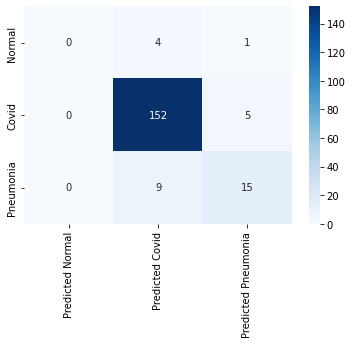

In [ ]:
confusion = confusion_matrix(y_test, y_pred, labels=[0, 1,2])
cm = pd.DataFrame(data=confusion,
                  index=["Normal", "Covid","Pneumonia"],
                  columns=["Predicted Normal", "Predicted Covid", "Predicted Pneumonia"])
import seaborn as sns
sns.heatmap(cm,annot=True,fmt="d",cmap=plt.cm.Blues)

In [ ]:
compare_df.loc['LR'] = evaluate_model(confusion, y_test,y_pred)

# Naive Byes

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.naive_bayes import GaussianNB

param_grid = {'var_smoothing': np.logspace(0,-9, num=100)}






grid = GridSearchCV(GaussianNB(), param_grid, refit = True, verbose = 2,cv = 3)

grid.fit(X_train,y_train)


Fitting 3 folds for each of 100 candidates, totalling 300 fits
[CV] END ..................................var_smoothing=1.0; total time=   0.0s
[CV] END ..................................var_smoothing=1.0; total time=   0.0s
[CV] END ..................................var_smoothing=1.0; total time=   0.0s
[CV] END ...................var_smoothing=0.8111308307896871; total time=   0.0s
[CV] END ...................var_smoothing=0.8111308307896871; total time=   0.0s
[CV] END ...................var_smoothing=0.8111308307896871; total time=   0.0s
[CV] END ....................var_smoothing=0.657933224657568; total time=   0.0s
[CV] END ....................var_smoothing=0.657933224657568; total time=   0.0s
[CV] END ....................var_smoothing=0.657933224657568; total time=   0.0s
[CV] END ....................var_smoothing=0.533669923120631; total time=   0.0s
[CV] END ....................var_smoothing=0.533669923120631; total time=   0.0s
[CV] END ....................var_smoothing=0.5

GridSearchCV(cv=3, estimator=GaussianNB(),
             param_grid={'var_smoothing': array([1.00000000e+00, 8.11130831e-01, 6.57933225e-01, 5.33669923e-01,
       4.32876128e-01, 3.51119173e-01, 2.84803587e-01, 2.31012970e-01,
       1.87381742e-01, 1.51991108e-01, 1.23284674e-01, 1.00000000e-01,
       8.11130831e-02, 6.57933225e-02, 5.33669923e-02, 4.32876128e-02,
       3.51119173e-02, 2.84803587e-02, 2.31...
       1.23284674e-07, 1.00000000e-07, 8.11130831e-08, 6.57933225e-08,
       5.33669923e-08, 4.32876128e-08, 3.51119173e-08, 2.84803587e-08,
       2.31012970e-08, 1.87381742e-08, 1.51991108e-08, 1.23284674e-08,
       1.00000000e-08, 8.11130831e-09, 6.57933225e-09, 5.33669923e-09,
       4.32876128e-09, 3.51119173e-09, 2.84803587e-09, 2.31012970e-09,
       1.87381742e-09, 1.51991108e-09, 1.23284674e-09, 1.00000000e-09])},
             verbose=2)

In [ ]:
print("tuned hpyerparameters :(best parameters) ",grid.best_params_)
print("accuracy :",grid.best_score_)

tuned hpyerparameters :(best parameters)  {'var_smoothing': 0.0001232846739442066}
accuracy : 0.8844987228607918


In [ ]:
NB=GaussianNB(var_smoothing =  0.0001232846739442066)

NB.fit(X_train,y_train)

GaussianNB(var_smoothing=0.0001232846739442066)

In [ ]:
import pickle
filename = 'nb-model.pkl'
pickle.dump(NB, open(filename, 'wb'))

## Evaluation

In [ ]:
import pickle
filename = 'nb-model.pkl'
# pickle.dump(DT, open(filename, 'wb'))
with open(filename, 'rb') as f:
    NB =   pickle.load(f)

In [ ]:

y_pred = NB.predict(X_test)
 

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         5
           1       0.91      0.94      0.93       157
           2       0.58      0.58      0.58        24

    accuracy                           0.87       186
   macro avg       0.50      0.51      0.50       186
weighted avg       0.85      0.87      0.86       186



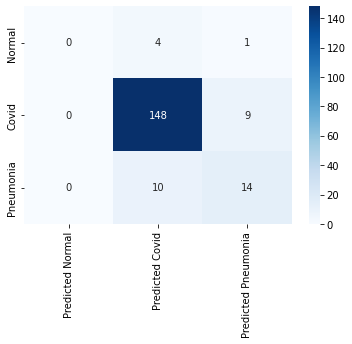

In [ ]:
confusion = confusion_matrix(y_test, y_pred, labels=[0, 1,2])
cm = pd.DataFrame(data=confusion,
                  index=["Normal", "Covid","Pneumonia"],
                  columns=["Predicted Normal", "Predicted Covid", "Predicted Pneumonia"])
import seaborn as sns
sns.heatmap(cm,annot=True,fmt="d",cmap=plt.cm.Blues)

In [ ]:
compare_df.loc['NB'] = evaluate_model(confusion, y_test,y_pred)

# Models Comparaison

In [ ]:
compare_df

,Accuracy,Specifity,Sensitivity,Precision,Recall,F1-Score,Mcc,NPV
DT,0.9,0.88,0.63,0.63,0.63,0.63,0.62,0.88
LR,0.9,0.84,0.53,0.55,0.53,0.54,0.58,0.89
MLP,0.92,0.83,0.53,0.64,0.53,0.56,0.67,0.97
NB,0.87,0.82,0.51,0.5,0.51,0.5,0.48,0.85
RF,0.91,0.81,0.51,0.61,0.51,0.54,0.61,0.95
SVM,0.89,0.86,0.54,0.54,0.54,0.54,0.58,0.88


# Load models

In [21]:
import pickle
import random

In [ ]:
# class_names = X_train.columns
# X_train = X_train.to_numpy()
# X_test = X_test.to_numpy()
# y_train = y_train.to_numpy()
# y_test = y_test.to_numpy()

In [22]:
def load_model(filename):
  

  with open(filename, 'rb') as f:
    model =   pickle.load(f)
    return model


In [ ]:
DT  = load_model('dt-model.pkl')

In [23]:
MLP  = load_model('mlp-model.pkl')

In [ ]:
RF = load_model('rf-model.pkl')

In [ ]:
SVM = load_model('svm-model.pkl')

In [ ]:
LR = load_model('lg-model.pkl')

In [ ]:
NB = load_model('nb-model.pkl')

# Xai Methods

## LIME

In [ ]:
!pip install lime

In [61]:
import lime
from lime import lime_tabular


In [62]:
def lime_xai(model):
  explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,  
  mode='classification',
  training_labels=df['finding'],
  feature_names=feature_cols,
  class_names=classes)


  i = random.randint(1, len(X_test.values))

  exp = explainer.explain_instance(df.loc[i,feature_cols].astype(int).values, model.predict_proba, num_features=21, top_labels=3)
  return exp, i

def show_exp(exp, c):
  print("Actual case              : ",c)
  print("Explanation Local Prediction              : ", exp.local_pred)
  print("Explanation Global Prediction Probability : ", exp.predict_proba)
  print("Explanation Global Prediction             : ", classes[np.argmax(exp.predict_proba)])

### MLP & Lime

In [ ]:
exp, c  = lime_xai(MLP)
exp.show_in_notebook(show_table=True)


In [ ]:
actual = classes[y_test.values[c]]
show_exp(exp,actual)

Actual case              :  Covid
Explanation Local Prediction              :  [-0.03843823]
Explanation Global Prediction Probability :  [0.00332878 0.94817062 0.04850061]
Explanation Global Prediction             :  Covid


In [68]:
exp, c  = lime_xai(MLP)
exp.show_in_notebook(show_table=True)


### DT & Lime

In [ ]:
exp,c  = lime_xai(DT)
exp.show_in_notebook(show_table=True)


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  "X does not have valid feature names, but"


In [ ]:
actual = classes[y_test.values[c]]
show_exp(exp,actual)

Actual case              :  Covid
Explanation Local Prediction              :  [0.91435875]
Explanation Global Prediction Probability :  [0. 1. 0.]
Explanation Global Prediction             :  Covid


### RF & Lime

In [ ]:
exp , c = lime_xai(RF)
exp.show_in_notebook(show_table=True)


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  "X does not have valid feature names, but"


In [ ]:
actual = classes[y_test.values[c]]
show_exp(exp,actual)

Actual case              :  Covid
Explanation Local Prediction              :  [1.05942952]
Explanation Global Prediction Probability :  [0.00555556 0.99166667 0.00277778]
Explanation Global Prediction             :  Covid


### SVM & Lime

In [ ]:

exp,c  = lime_xai(SVM)

exp.show_in_notebook(show_table=True)


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  "X does not have valid feature names, but"


In [ ]:
actual = classes[y_test.values[c]]
show_exp(exp,actual)

Actual case              :  Normal
Explanation Local Prediction              :  [0.7611185]
Explanation Global Prediction Probability :  [0.03287784 0.96028969 0.00683247]
Explanation Global Prediction             :  Covid


### Logistic Regression & Lime

In [ ]:

exp, c  = lime_xai(LR)

exp.show_in_notebook(show_table=True)


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  "X does not have valid feature names, but"


In [ ]:
actual = classes[y_test.values[c]]
show_exp(exp,actual)

Actual case              :  Covid
Explanation Local Prediction              :  [0.63073662]
Explanation Global Prediction Probability :  [2.01933727e-02 9.79789940e-01 1.66870085e-05]
Explanation Global Prediction             :  Covid


### Naive Bayes & Lime

In [ ]:

exp,c  = lime_xai(NB)

exp.show_in_notebook(show_table=True)


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  "X does not have valid feature names, but"


In [ ]:
actual = classes[y_test.values[c]]
show_exp(exp,actual)

Actual case              :  Covid
Explanation Local Prediction              :  [0.89749434]
Explanation Global Prediction Probability :  [7.46588112e-02 9.25159158e-01 1.82030618e-04]
Explanation Global Prediction             :  Covid


## SHAP

In [ ]:
!pip install shap

In [26]:
import shap

### MLP & Shap

In [ ]:
print("Test  Accuracy : ", MLP.score(X_test, y_test))
print("Train Accuracy : ", MLP.score(X_train, y_train))

Test  Accuracy :  0.9193548387096774
Train Accuracy :  0.9468822170900693


In [ ]:
shap.initjs()

In [ ]:
x_test = X_test.to_numpy()
x_train = X_train.to_numpy()

In [27]:
mlp_explainer = shap.KernelExplainer(MLP.predict_proba, X_train)


Using 433 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


In [55]:
shap_values = mlp_explainer.shap_values(X_test)


  0%|          | 0/186 [00:00<?, ?it/s]

  0%|          | 0/186 [00:00<?, ?it/s]

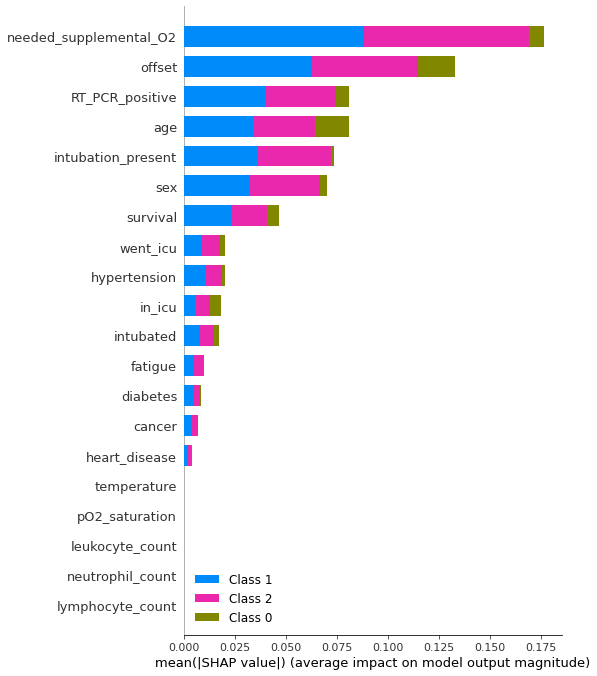

In [ ]:
shap.summary_plot(mlp_explainer.shap_values(X_test.values),
                  feature_names=feature_cols)

  0%|          | 0/186 [00:00<?, ?it/s]

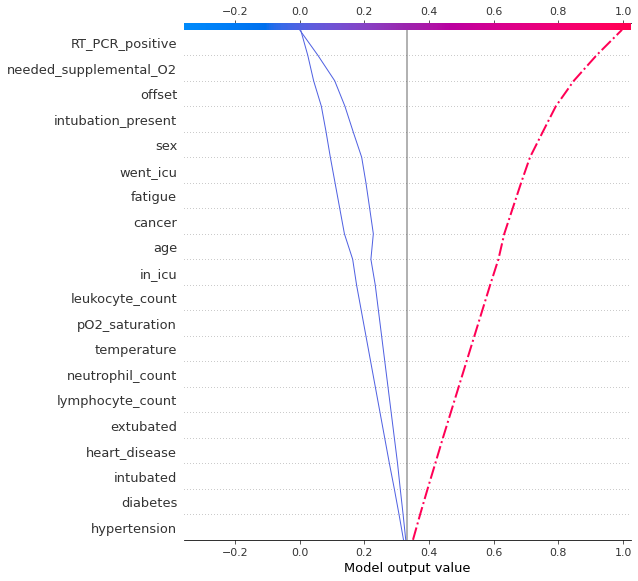

In [ ]:
shap.multioutput_decision_plot(mlp_explainer.expected_value.tolist(),
                               mlp_explainer.shap_values(X_test.values),
                               row_index=0,
                               feature_names=feature_cols,
                               highlight = [1]
                               )

In [56]:
sample_idx = 0



val1 = mlp_explainer.expected_value[0] + shap_values[0].sum() 
val2 = mlp_explainer.expected_value[1] + shap_values[1].sum() 
val3 = mlp_explainer.expected_value[2] + shap_values[2].sum() 

#### Class normal does not predicted in mlp model

#### Class : Covid

In [ ]:
y_test.values[sample_idx]

1

In [ ]:
print("Base Value : ", mlp_explainer.expected_value)

print("Prediction From Model                            : ", \
                     classes[MLP.predict(X_test.values[sample_idx].reshape(1, -1))[0]])
print("Prediction From Adding SHAP Values to Base Value : ", classes[np.argmax([val1, val2, val3])])

Base Value :  [0.02895689 0.84457481 0.12646829]
Prediction From Model                            :  Covid
Prediction From Adding SHAP Values to Base Value :  Covid


show covid class explication

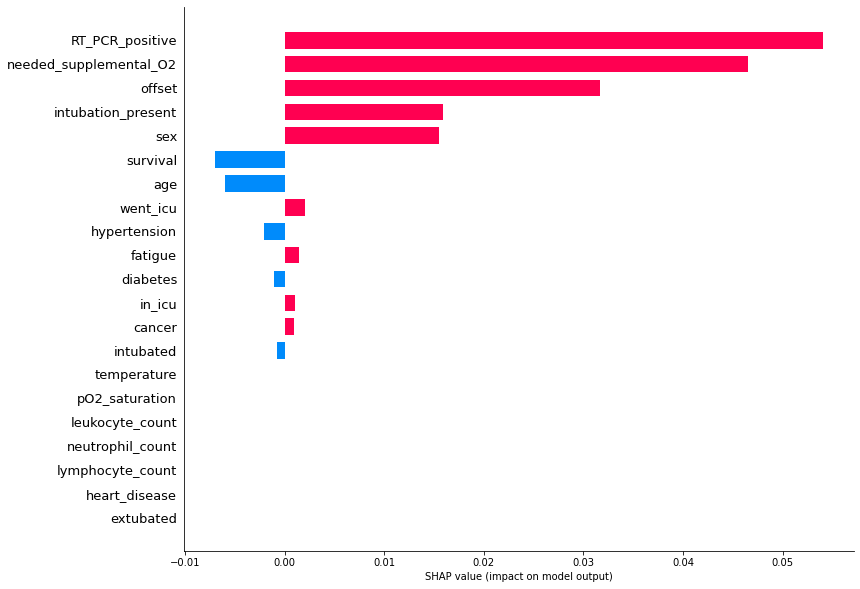

In [ ]:
plt.figure(figsize=(12, 10))
shap.bar_plot(mlp_explainer.shap_values(X_test.values[0])[1], feature_names=feature_cols, max_display=len(feature_cols))


  0%|          | 0/186 [00:00<?, ?it/s]

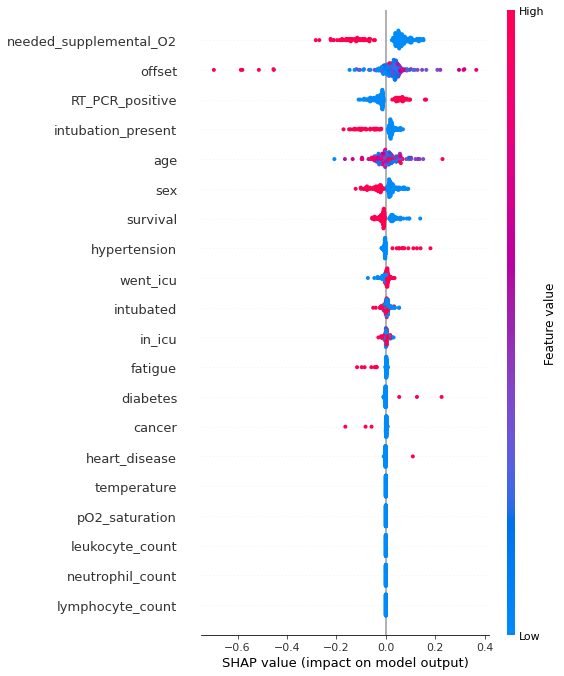

In [29]:
shap.summary_plot(mlp_explainer.shap_values(X_test.values)[1],
                  features=X_test.values,
                  feature_names=feature_cols)

#### Class : Pneumonia

In [ ]:
np.where(y_test.values == 2)

(array([  1,   9,  20,  25,  30,  32,  40,  64,  69,  77,  79,  82,  84,
         91,  94, 100, 116, 118, 119, 124, 127, 139, 169, 182]),)

In [57]:
sample_idx = 1




val1 = mlp_explainer.expected_value[0] + shap_values[0].sum() 
val2 = mlp_explainer.expected_value[1] + shap_values[1].sum() 
val3 = mlp_explainer.expected_value[2] + shap_values[2].sum() 

In [58]:
y_test.values[sample_idx]

2

In [59]:
print("Base Value : ", mlp_explainer.expected_value)

print("Prediction From Model                            : ", \
                     classes[MLP.predict(X_test.values[sample_idx].reshape(1, -1))[0]])
print("Prediction From Adding SHAP Values to Base Value : ", classes[np.argmax([val1, val2, val3])])

Base Value :  [0.02895689 0.84457481 0.12646829]
Prediction From Model                            :  Pneumonia
Prediction From Adding SHAP Values to Base Value :  Covid


plot pneumonia class explication

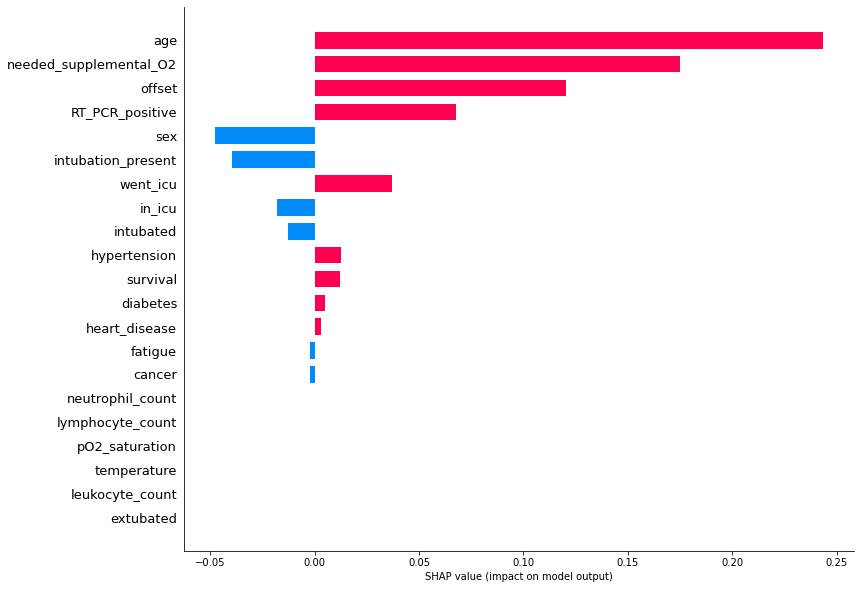

In [52]:
plt.figure(figsize=(12, 10))
shap.bar_plot(mlp_explainer.shap_values(X_test.values[1])[2], feature_names=feature_cols, max_display=len(feature_cols))


  0%|          | 0/186 [00:00<?, ?it/s]

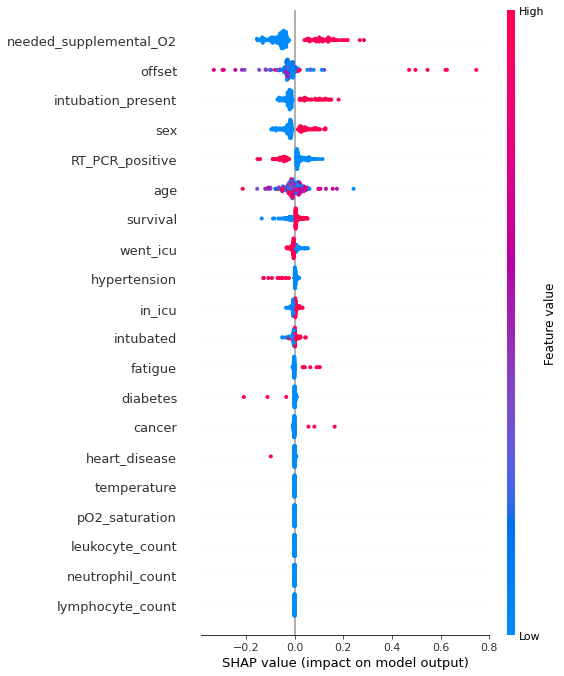

In [ ]:
shap.summary_plot(mlp_explainer.shap_values(X_test.values)[2],
                  features=X_test.values,
                  feature_names=feature_cols)

### DT & Shap

In [ ]:
print("Test  Accuracy : ", DT.score(X_test, y_test))
print("Train Accuracy : ", DT.score(X_train, y_train))

Test  Accuracy :  0.8978494623655914
Train Accuracy :  0.9953810623556582


In [ ]:
shap.initjs()

In [ ]:
x_test = X_test.to_numpy()
x_train = X_train.to_numpy()

In [ ]:
log_reg_explainer = shap.TreeExplainer(DT)


In [ ]:
sample_idx = 0

shap_vals = log_reg_explainer.shap_values(x_test[sample_idx])

val1 = log_reg_explainer.expected_value[0] + shap_vals[0].sum()
val2 = log_reg_explainer.expected_value[1] + shap_vals[1].sum()
val3 = log_reg_explainer.expected_value[2] + shap_vals[2].sum()

In [ ]:
y_test.values[0]

1

In [ ]:
print("Base Value : ", log_reg_explainer.expected_value)

print("Prediction From Model                            : ", \
                     classes[DT.predict(x_test[sample_idx].reshape(1, -1))[0]])
print("Prediction From Adding SHAP Values to Base Value : ", classes[np.argmax([val1, val2, val3])])

Base Value :  [0.03002309 0.83833718 0.13163972]
Prediction From Model                            :  Covid
Prediction From Adding SHAP Values to Base Value :  Covid


X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names


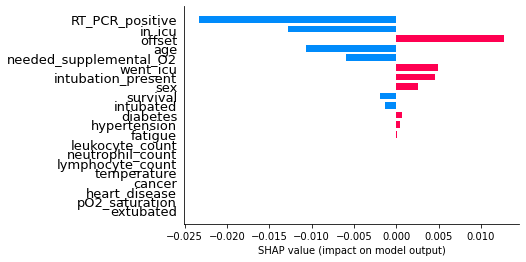

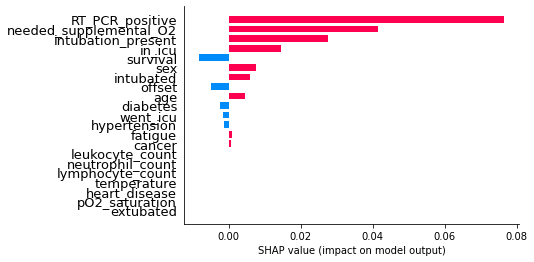

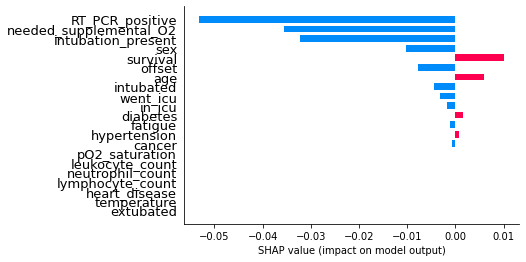

In [ ]:
shap.bar_plot(log_reg_explainer.shap_values(x_test[0])[0], feature_names=feature_cols, max_display=len(feature_cols))
shap.bar_plot(log_reg_explainer.shap_values(x_test[0])[1], feature_names=feature_cols, max_display=len(feature_cols))
shap.bar_plot(log_reg_explainer.shap_values(x_test[0])[2], feature_names=feature_cols, max_display=len(feature_cols))

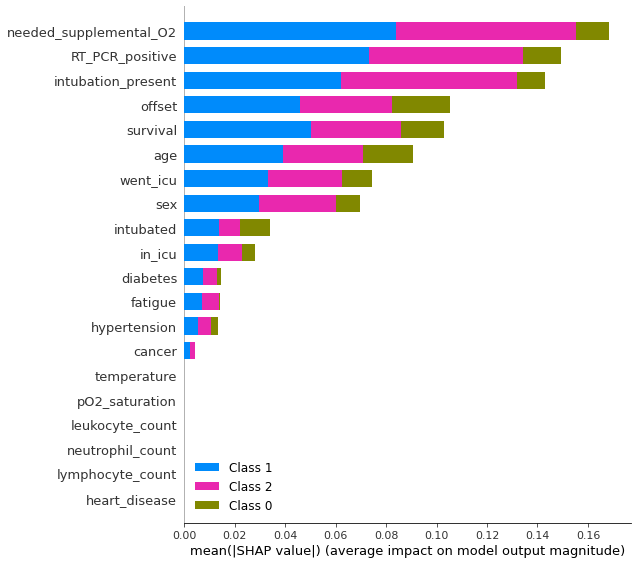

In [ ]:
shap.summary_plot(log_reg_explainer.shap_values(x_test),
                  feature_names=feature_cols)

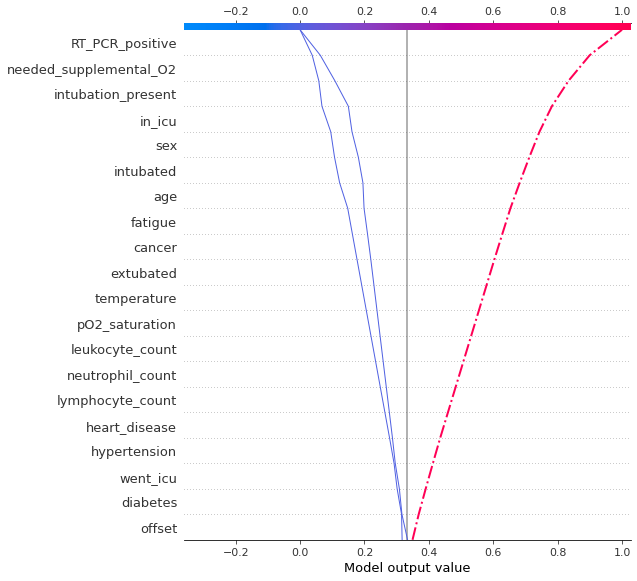

In [ ]:
shap.multioutput_decision_plot(log_reg_explainer.expected_value.tolist(),
                               log_reg_explainer.shap_values(x_test),
                               row_index=0,
                               feature_names=feature_cols,
                               highlight = [1]
                               )

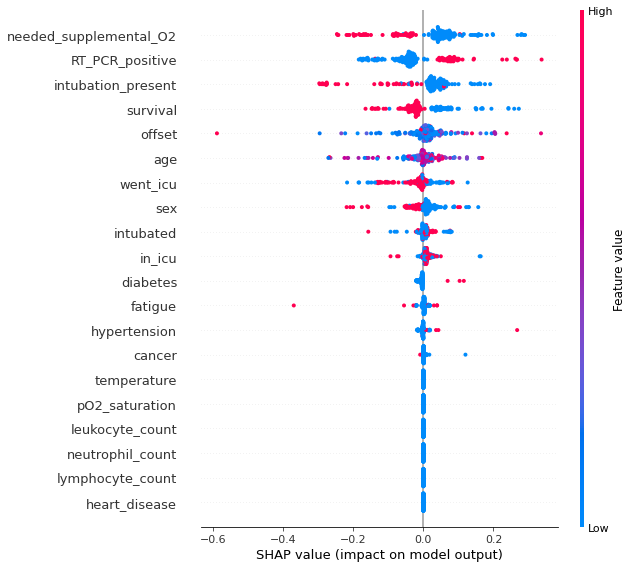

In [ ]:
shap.summary_plot(log_reg_explainer.shap_values(x_test)[1],
                  features=x_test,
                  feature_names=feature_cols)

## PDP

### Select best features

In [30]:
from sklearn.inspection import permutation_importance
def features_importance(model, X,y):
  scoring = ['accuracy','r2', 'neg_mean_squared_error']
  imp = permutation_importance(model, X, y, scoring=scoring, n_repeats=3, random_state=42)
  df_imp = pd.DataFrame(
    data={'importance': imp['r2']['importances_mean']}, index=feature_cols
  )
  return df_imp.sort_values(by='importance', ascending=False).plot(kind='bar', figsize=(10, 5))

In [31]:
feature_cols = ['offset','sex','age','RT_PCR_positive','survival','intubated','intubation_present','went_icu','in_icu','needed_supplemental_O2','extubated','temperature','pO2_saturation','leukocyte_count','neutrophil_count','lymphocyte_count','hypertension','diabetes','heart_disease','cancer','fatigue']

In [ ]:
metrics.SCORERS.keys()

dict_keys(['explained_variance', 'r2', 'max_error', 'neg_median_absolute_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error', 'neg_mean_squared_error', 'neg_mean_squared_log_error', 'neg_root_mean_squared_error', 'neg_mean_poisson_deviance', 'neg_mean_gamma_deviance', 'accuracy', 'top_k_accuracy', 'roc_auc', 'roc_auc_ovr', 'roc_auc_ovo', 'roc_auc_ovr_weighted', 'roc_auc_ovo_weighted', 'balanced_accuracy', 'average_precision', 'neg_log_loss', 'neg_brier_score', 'adjusted_rand_score', 'rand_score', 'homogeneity_score', 'completeness_score', 'v_measure_score', 'mutual_info_score', 'adjusted_mutual_info_score', 'normalized_mutual_info_score', 'fowlkes_mallows_score', 'precision', 'precision_macro', 'precision_micro', 'precision_samples', 'precision_weighted', 'recall', 'recall_macro', 'recall_micro', 'recall_samples', 'recall_weighted', 'f1', 'f1_macro', 'f1_micro', 'f1_samples', 'f1_weighted', 'jaccard', 'jaccard_macro', 'jaccard_micro', 'jaccard_samples', 'jaccard_wei

In [32]:

from sklearn.inspection import PartialDependenceDisplay


### MLP & PDP

In [33]:

from sklearn.inspection import PartialDependenceDisplay


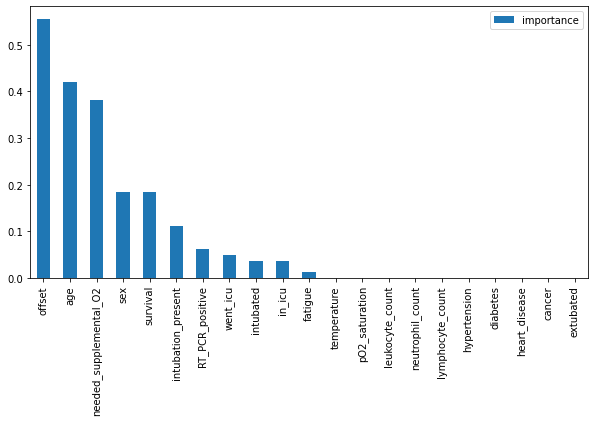

In [34]:
imp_mlp = features_importance(MLP, X_test,y_test)


In [36]:
list_features = [feature_cols.index("offset"),
                 feature_cols.index("age"),
                                   feature_cols.index("needed_supplemental_O2"),
                                   feature_cols.index("sex")]

In [37]:
list_features

[0, 2, 9, 1]

#### Class :Covid

In [38]:
MLP.classes_[1]

1

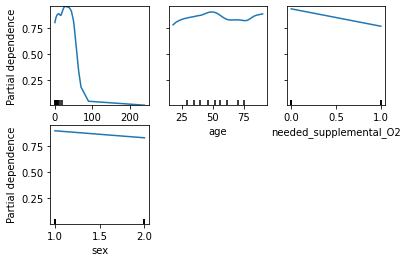

In [39]:

display_covid = PartialDependenceDisplay.from_estimator(
    MLP,       feature_names=feature_cols,
                                   features=list_features,
                                   X=X_test,
                                  
                                   target =MLP.classes_[1]
)


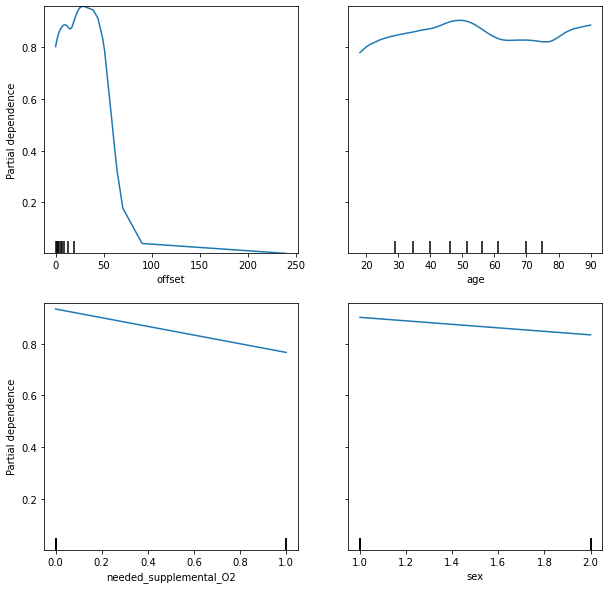

In [40]:
fig , ax1 = plt.subplots(2, 2, figsize=(10, 10))
display_covid.plot(ax=ax1)

#### Class : Pneumonia

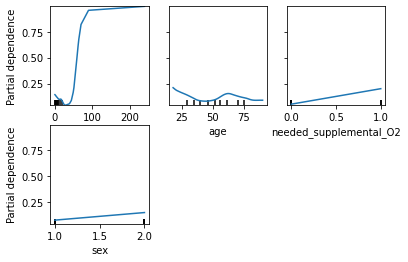

In [41]:

display_pneumonia = PartialDependenceDisplay.from_estimator(
    MLP,       feature_names=feature_cols,
                                   features=list_features,
                                   X=X_test,
                                  
                                   target =MLP.classes_[2]
)


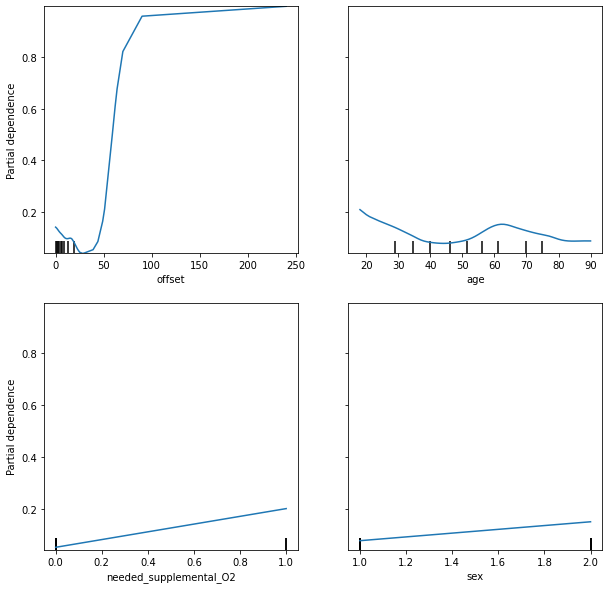

In [42]:
fig , ax1 = plt.subplots(2, 2, figsize=(10, 10))
display_pneumonia.plot(ax=ax1)

#### Class : Normal

In [45]:
MLP.classes_[0]

0

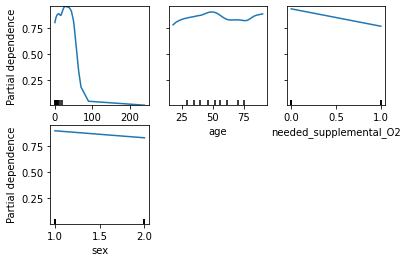

In [48]:

display_normal = PartialDependenceDisplay.from_estimator(
    MLP,       feature_names=feature_cols,
                                   features=list_features,
                                   X=X_test,
                                  
                                   target =MLP.classes_[0]
)

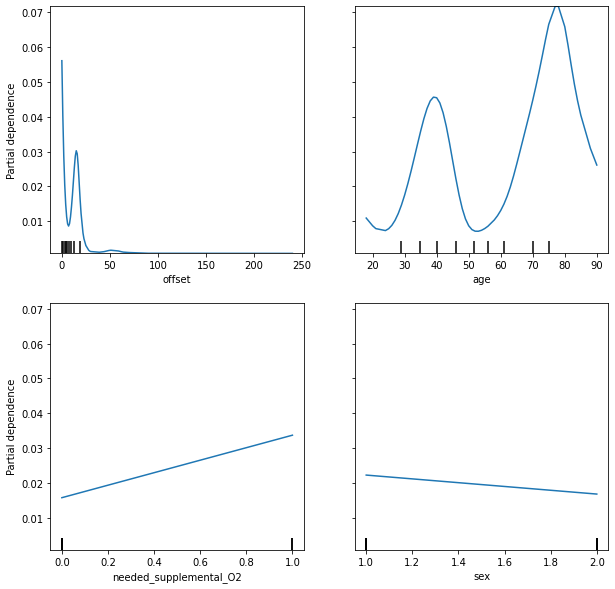

In [44]:
fig , ax1 = plt.subplots(2, 2, figsize=(10, 10))
display_normal.plot(ax=ax1)

### DT & PDP

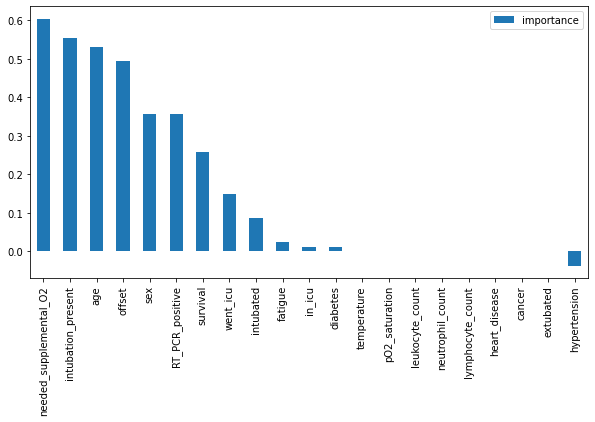

In [ ]:
imp_dt= features_importance(DT, X_test,y_test)


In [ ]:
list_features = [feature_cols.index("needed_supplemental_O2"),feature_cols.index("intubation_present")
                                   ,feature_cols.index("age"),
                                   feature_cols.index("offset")]

#### Class :Covid

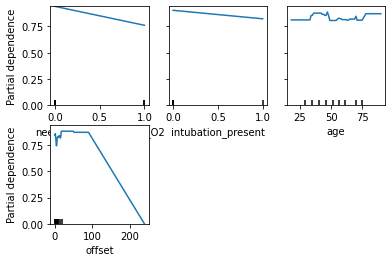

In [ ]:

display_covid = PartialDependenceDisplay.from_estimator(
    DT,       feature_names=feature_cols,
                                   features=list_features,
                                   X=X_test,
                                  
                                   target =DT.classes_[1]
)


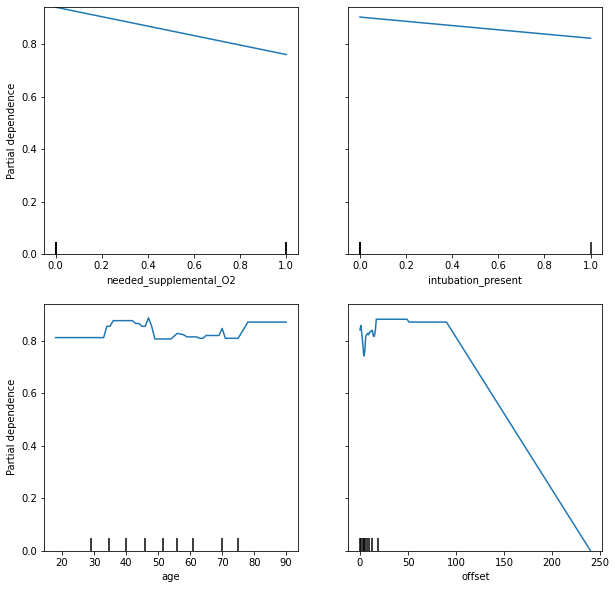

In [ ]:
fig , ax1 = plt.subplots(2, 2, figsize=(10, 10))
display_covid.plot(ax=ax1)

#### Class : Pneumonia

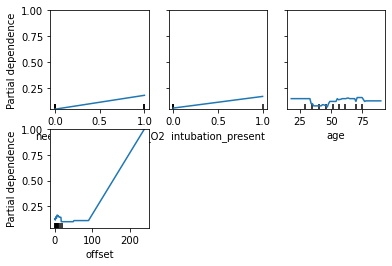

In [ ]:

display_pneumonia = PartialDependenceDisplay.from_estimator(
    DT,       feature_names=feature_cols,
                                   features=list_features,
                                   X=X_test,
                                  
                                   target =DT.classes_[2]
)


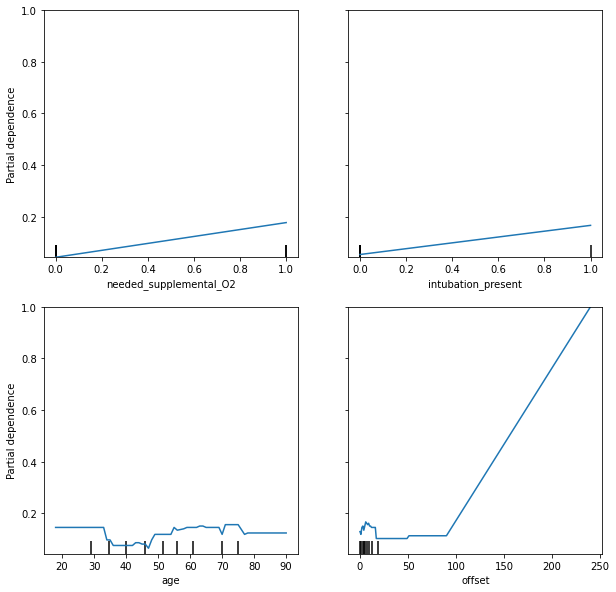

In [ ]:
fig , ax1 = plt.subplots(2, 2, figsize=(10, 10))
display_pneumonia.plot(ax=ax1)

#### Class : Normal

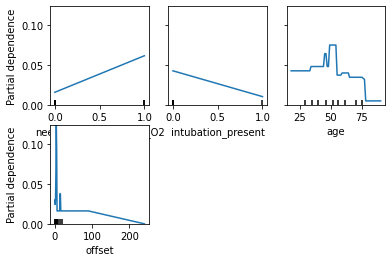

In [ ]:

display_normal = PartialDependenceDisplay.from_estimator(
    DT,       feature_names=feature_cols,
                                   features=list_features,
                                   X=X_test,
                                  
                                   target =DT.classes_[0]
)

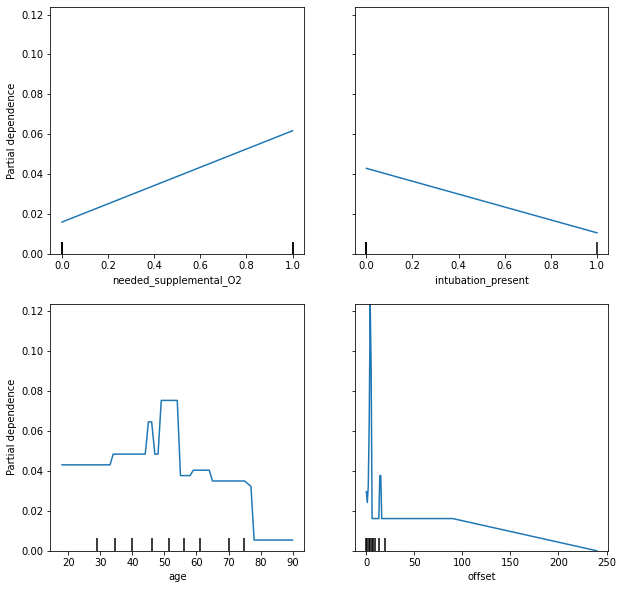

In [ ]:
fig , ax1 = plt.subplots(2, 2, figsize=(10, 10))
display_normal.plot(ax=ax1)

### RF & PDP

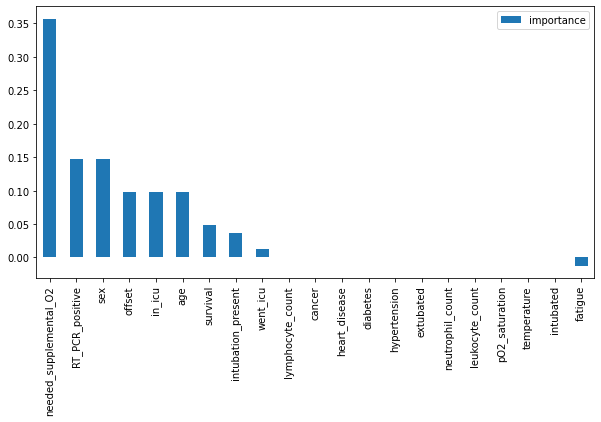

In [ ]:
imp_rf= features_importance(RF, X_test,y_test)


In [ ]:
list_features = [feature_cols.index("needed_supplemental_O2"),feature_cols.index("RT_PCR_positive")
                                   ,feature_cols.index("sex"),
                                   feature_cols.index("offset")]

#### Class :Covid

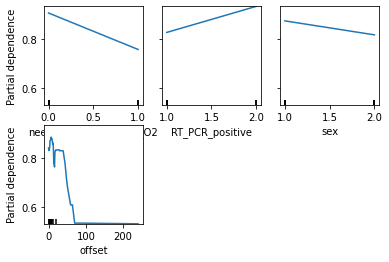

In [ ]:

display_covid = PartialDependenceDisplay.from_estimator(
    RF,       feature_names=feature_cols,
                                   features=list_features,
                                   X=X_test,
                                  
                                   target =RF.classes_[1]
)


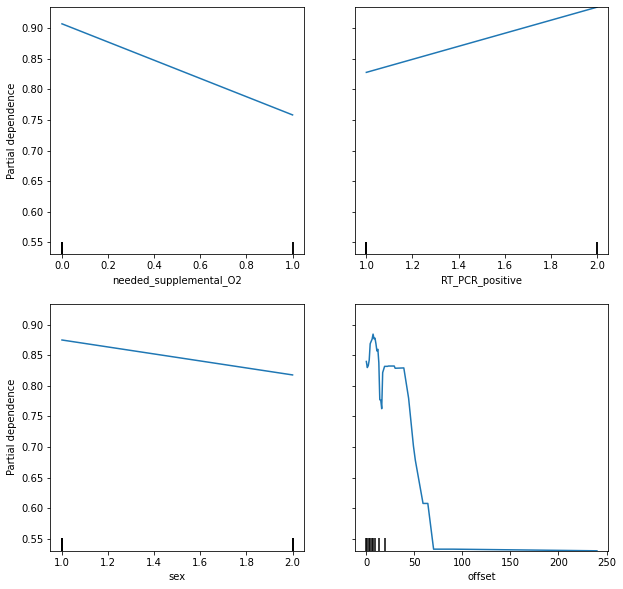

In [ ]:
fig , ax1 = plt.subplots(2, 2, figsize=(10, 10))
display_covid.plot(ax=ax1)

#### Class : Pneumonia

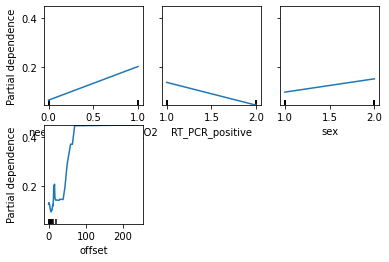

In [ ]:

display_pneumonia = PartialDependenceDisplay.from_estimator(
    RF,       feature_names=feature_cols,
                                   features=list_features,
                                   X=X_test,
                                  
                                   target =RF.classes_[2]
)


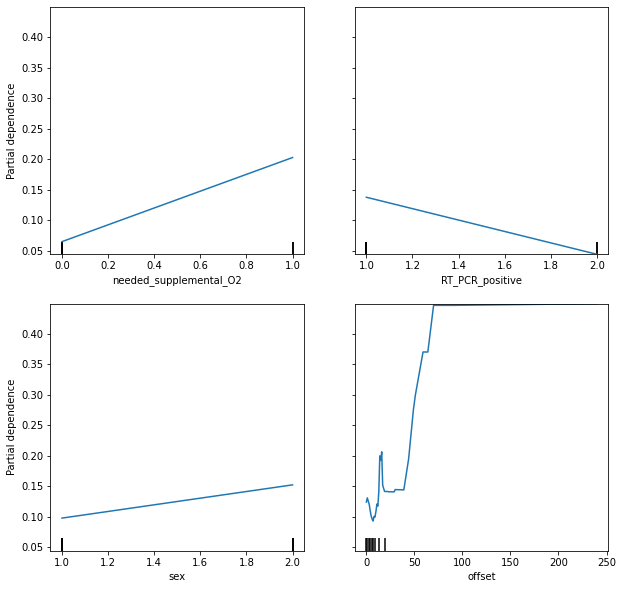

In [ ]:
fig , ax1 = plt.subplots(2, 2, figsize=(10, 10))
display_pneumonia.plot(ax=ax1)

#### Class : Normal

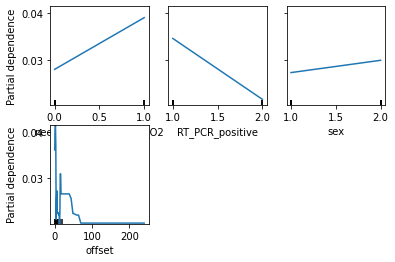

In [ ]:

display_normal = PartialDependenceDisplay.from_estimator(
    RF,       feature_names=feature_cols,
                                   features=list_features,
                                   X=X_test,
                                  
                                   target =RF.classes_[0]
)

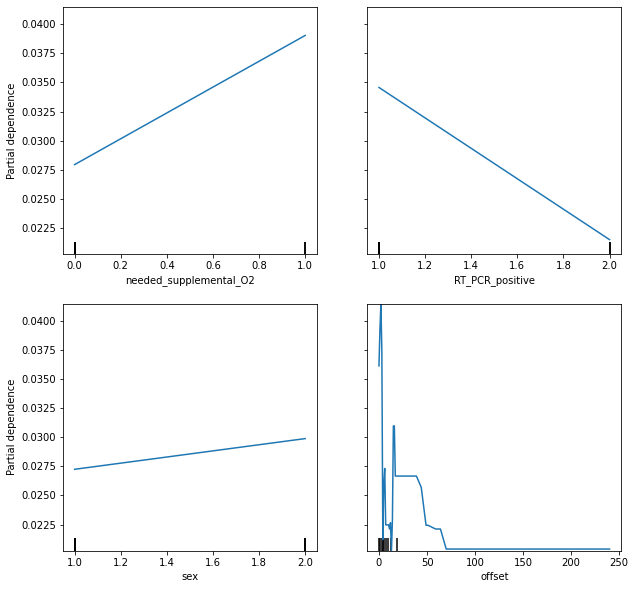

In [ ]:
fig , ax1 = plt.subplots(2, 2, figsize=(10, 10))
display_normal.plot(ax=ax1)

### Logistic Regression & PDP

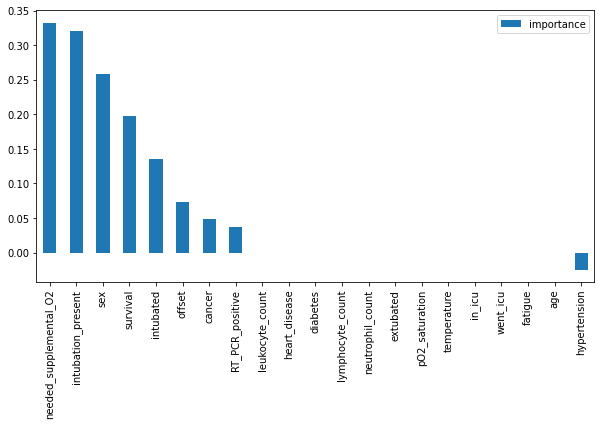

In [ ]:
imp_lr= features_importance(LR, X_test,y_test)


In [ ]:
list_features = [feature_cols.index("needed_supplemental_O2"),feature_cols.index("intubation_present")
                                   ,feature_cols.index("sex"),
                                   feature_cols.index("survival")]

#### Class :Covid

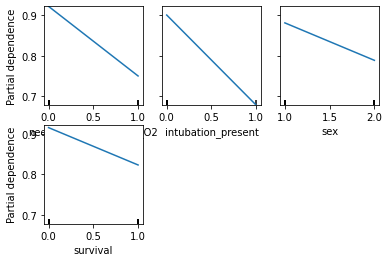

In [ ]:

display_covid = PartialDependenceDisplay.from_estimator(
    LR,       feature_names=feature_cols,
                                   features=list_features,
                                   X=X_test,
                                  
                                   target =LR.classes_[1]
)


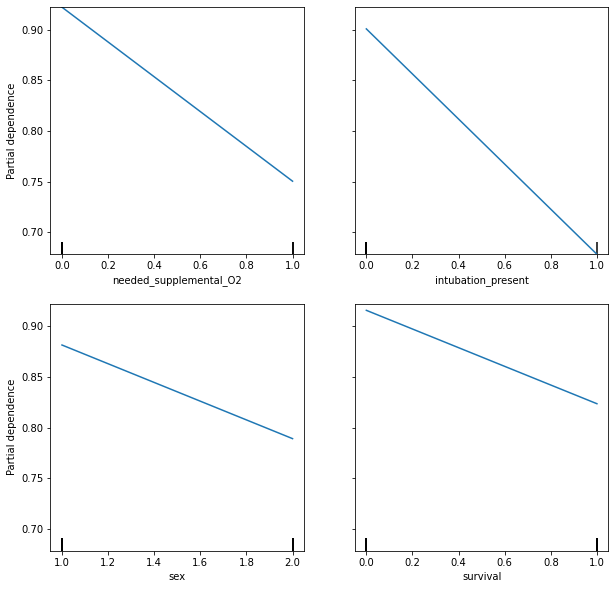

In [ ]:
fig , ax1 = plt.subplots(2, 2, figsize=(10, 10))
display_covid.plot(ax=ax1)

#### Class : Pneumonia

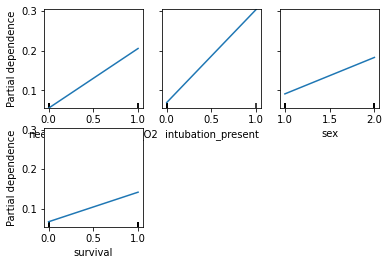

In [ ]:

display_pneumonia = PartialDependenceDisplay.from_estimator(
    LR,       feature_names=feature_cols,
                                   features=list_features,
                                   X=X_test,
                                  
                                   target =LR.classes_[2]
)


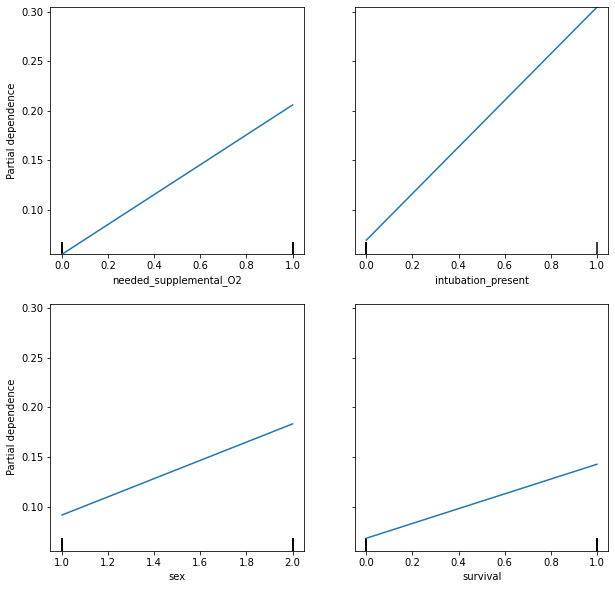

In [ ]:
fig , ax1 = plt.subplots(2, 2, figsize=(10, 10))
display_pneumonia.plot(ax=ax1)

#### Class : Normal

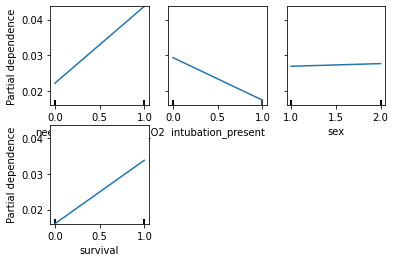

In [ ]:

display_normal = PartialDependenceDisplay.from_estimator(
    LR,       feature_names=feature_cols,
                                   features=list_features,
                                   X=X_test,
                                  
                                   target =LR.classes_[0]
)

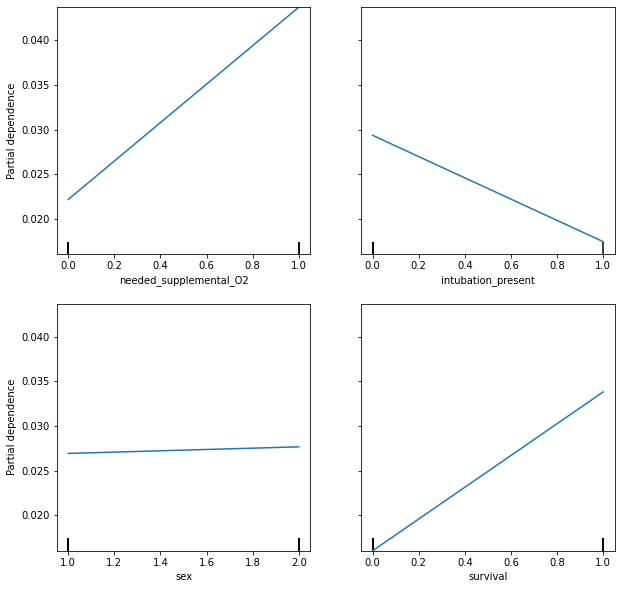

In [ ]:
fig , ax1 = plt.subplots(2, 2, figsize=(10, 10))
display_normal.plot(ax=ax1)

### SVM & PDP

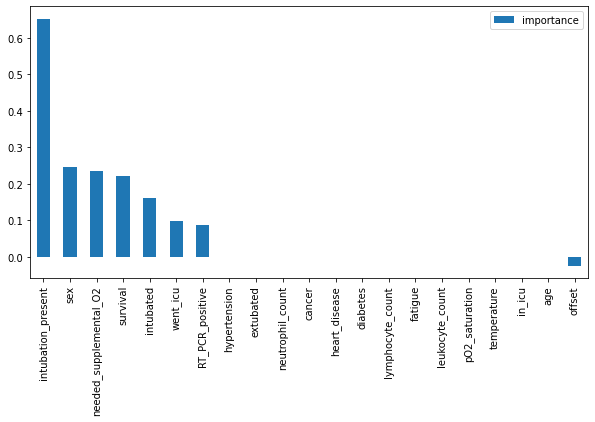

In [ ]:
imp_lr= features_importance(SVM, X_test,y_test)


In [ ]:
list_features = [feature_cols.index("intubation_present"),
                 feature_cols.index("sex"),
                 feature_cols.index("needed_supplemental_O2"),
                                   
                         feature_cols.index("survival")]

#### Class :Covid

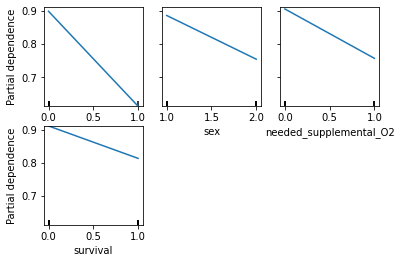

In [ ]:

display_covid = PartialDependenceDisplay.from_estimator(
    SVM,       feature_names=feature_cols,
                                   features=list_features,
                                   X=X_test,
                                  
                                   target =SVM.classes_[1]
)


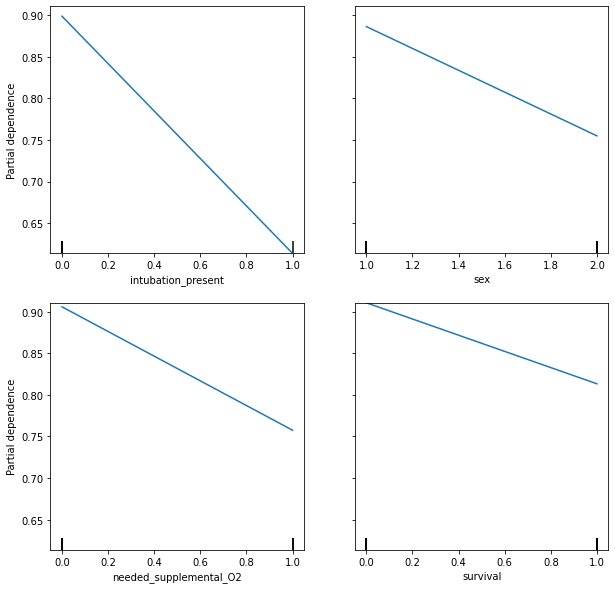

In [ ]:
fig , ax1 = plt.subplots(2, 2, figsize=(10, 10))
display_covid.plot(ax=ax1)

#### Class : Pneumonia

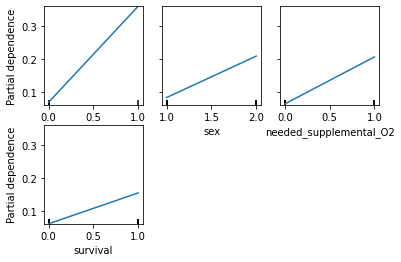

In [ ]:

display_pneumonia = PartialDependenceDisplay.from_estimator(
    SVM,       feature_names=feature_cols,
                                   features=list_features,
                                   X=X_test,
                                  
                                   target =SVM.classes_[2]
)


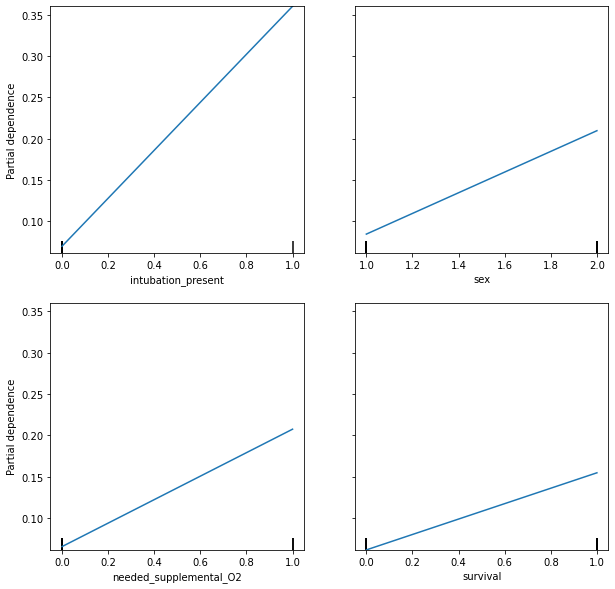

In [ ]:
fig , ax1 = plt.subplots(2, 2, figsize=(10, 10))
display_pneumonia.plot(ax=ax1)

#### Class : Normal

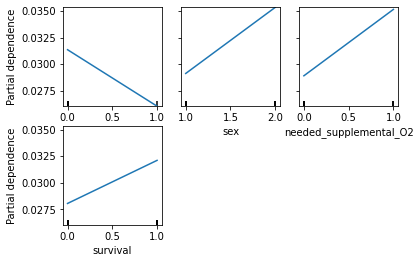

In [ ]:

display_normal = PartialDependenceDisplay.from_estimator(
    SVM,       feature_names=feature_cols,
                                   features=list_features,
                                   X=X_test,
                                  
                                   target =SVM.classes_[0]
)

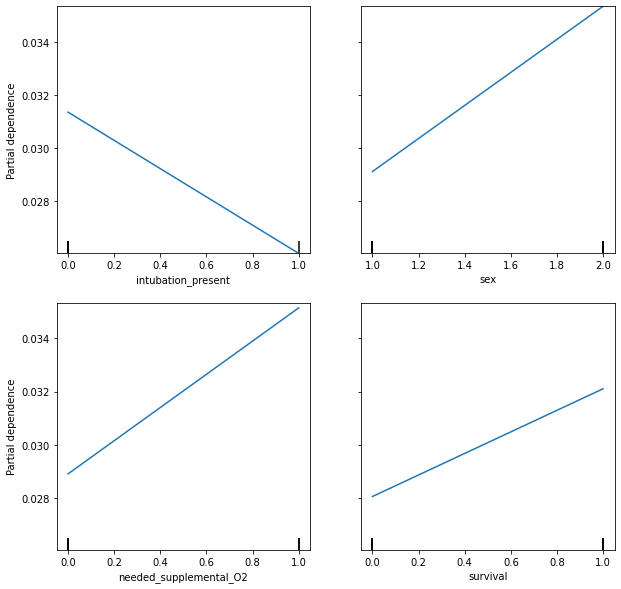

In [ ]:
fig , ax1 = plt.subplots(2, 2, figsize=(10, 10))
display_normal.plot(ax=ax1)